# Comp1-传统组学

主要适配于传统组学的建模和刻画。典型的应用场景探究rad_score最最终临床诊断的作用。

数据的一般形式为(具体文件,文件夹名可以不同)：
1. `images`文件夹，存放研究对象所有的CT、MRI等数据。
2. `masks`文件夹, 存放手工（Manuelly）勾画的ROI区域。与images文件夹的文件意义对应。
3. `label.txt`文件，每个患者对应的标签，例如肿瘤的良恶性、5年存活状态等。

## Onekey步骤

1. 数据校验，检查数据格式是否正确。
2. 组学特征提取，如果第一步检查数据通过，则提取对应数据的特征。
3. 读取标注数据信息。
4. 特征与标注数据拼接。形成数据集。
5. 查看一些统计信息，检查数据时候存在异常点。
6. 正则化，将数据变化到服从 N~(0, 1)。
7. 通过相关系数，例如spearman、person等筛选出特征。
8. 构建训练集和测试集，这里使用的是随机划分，正常多中心验证，需要大家根据自己的场景构建两份数据。
9. 通过Lasso筛选特征，选取其中的非0项作为后续模型的特征。
10. 使用机器学习算法，例如LR、SVM、RF等进行任务学习。
11. 模型结果可视化，例如AUC、ROC曲线，混淆矩阵等。


In [ ]:
## 获得视频教程
from onekey_algo.custom.Manager import onekey_show
onekey_show('传统组学任务')

## 一、数据校验
首先需要检查诊断数据，如果显示`检查通过！`择可以正常运行之后的，否则请根据提示调整数据。

**注意**：这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [ ]:
# 数据检验视频
onekey_show('传统组学任务|数据检验')

### 指定数据

此模块有3个需要自己定义的参数

1. `mydir`: 数据存放的路径。
2. `labelf`: 每个样本的标注信息文件。
3. `labels`: 要让AI系统学习的目标，例如肿瘤的良恶性、T-stage等。

### 多模态设置

这个地方可以指定多模态类型，每种模态一个文件夹，每个文件夹里面同样包括images, masks文件夹。例如包括CT、DWI两个模态。

```python
modals = get_param_in_cwd('radio_dir') or ['CT', 'DWI']
```

In [54]:
import os
from IPython.display import display
os.environ['KMP_DUPLICATE_LIB_OK'] = 'TRUE'
from onekey_algo import OnekeyDS as okds
from onekey_algo import get_param_in_cwd

os.makedirs('img', exist_ok=True)
os.makedirs('results', exist_ok=True)
os.makedirs('features', exist_ok=True)

task_type = 'Radiomics_'
# 设置数据目录
mydir = get_param_in_cwd('radio_dir')
if mydir == okds.ct:
    print(f'正在使用Onekey数据：{okds.ct}，如果不符合预期，请修改目录位置！')
# 对应的标签文件
# labelf = r'你自己标注数据的文件地址'
labelf = get_param_in_cwd('label_file')
# 读取标签数据列名
labels = [get_param_in_cwd('task_column') or 'label']
# 获取分组列名
group_info = get_param_in_cwd('dataset_column')

### images和masks匹配

这里要求images和masks文件夹中的文件名必须一一对应。e.g. `1.nii.gz`为images中的一个文件，在masks文件夹必须也存在一个`1.nii.gz`文件。

当然也可以使用自定义的函数，获取解析数据。

In [55]:
from pathlib import Path
from onekey_algo.custom.components.Radiology import diagnose_3d_image_mask_settings, get_image_mask_from_dir

# 生成images和masks对，一对一的关系。也可以自定义替换。
images, masks = get_image_mask_from_dir(os.path.join(mydir), images='images', masks='masks')
# diagnose_3d_image_mask_settings(images, masks)
print(f'获取到{len(images)}个样本。')

获取到401个样本。


# 传统组学特征

使用pyradiomics提取传统组学特征，正常这块不需要修改，下面是具体的Onekey封装的接口。

```python
def extract(self, images: Union[str, List[str]], 
            masks: Union[str, List[str]], labels: Union[int, List[int]] = 1, settings=None)
"""
    * images: List结构，待提取的图像列表。
    * masks: List结构，待提取的图像对应的mask，与Images必须一一对应。
    * labels: 提取标注为什么标签的特征。默认为提取label=1的。
    * settings: 其他提取特征的参数。默认为None。

"""
```

```python
def get_label_data_frame(self, label: int = 1, column_names=None, images='images', masks='labels')
"""
    * label: 获取对应label的特征。
    * columns_names: 默认为None，使用程序设定的列名即可。
"""
```
    
```python
def get_image_mask_from_dir(root, images='images', masks='labels')
"""
    * root: 待提取特征的目录。
    * images: root目录中原始数据的文件夹名。
    * masks: root目录中标注数据的文件夹名。
"""
```


In [7]:
# 特征提取视频
onekey_show('传统组学任务|特征提取')

NameError: name 'onekey_show' is not defined

In [56]:
import warnings
import pandas as pd
 
warnings.filterwarnings("ignore")

from onekey_algo.custom.components.Radiology import ConventionalRadiomics

rad_ = None
param_file = get_param_in_cwd('extractor_settings')

if os.path.exists(f'features/rad_features.csv'):
    rad_data = pd.read_csv(f'features/rad_features.csv', header=0)
else:
    images, masks = get_image_mask_from_dir(os.path.join(mydir), images='images', masks='masks')
    radiomics = ConventionalRadiomics(param_file, correctMask=True)
    radiomics.extract(images, masks, workers=1, labels=1,  
                      with_top=get_param_in_cwd('with_fd', False),
                      with_fd=get_param_in_cwd('with_toplogy', False), 
                      with_hessian=get_param_in_cwd('with_hessian', False))
    rad_data = radiomics.get_label_data_frame(label=1)
    rad_data.columns = [f"{c.replace('-', '_')}" if c != 'ID' else 'ID' for c in rad_data.columns]
    rad_data.to_csv(f'features/rad_features.csv', header=True, index=False)
if rad_ is None:
    rad_ = rad_data
else:
    rad_ = pd.merge(rad_, rad_data, on='ID', how='inner')
rad_data = rad_
rad_data

,ID,A_exponential_firstorder_10Percentile,A_exponential_firstorder_90Percentile,A_exponential_firstorder_Energy,A_exponential_firstorder_Entropy,A_exponential_firstorder_InterquartileRange,A_exponential_firstorder_Kurtosis,A_exponential_firstorder_Maximum,A_exponential_firstorder_Mean,A_exponential_firstorder_MeanAbsoluteDeviation,...,DL_2039,DL_2040,DL_2041,DL_2042,DL_2043,DL_2044,DL_2045,DL_2046,DL_2047,DL_2048
0,1.nii.gz,16.424,47.131,4.502e+08,3.199,13.532,4.004,86.772,31.549,9.038,...,0.826,1.159,0.833,0.732,0.693,0.696,0.856,0.744,0.720,0.807
1,10.nii.gz,14.369,111.804,1.952e+09,4.517,41.287,51.166,918.845,51.606,34.042,...,0.930,1.810,0.887,0.913,1.091,0.746,1.457,1.213,1.414,0.661
2,100.nii.gz,187.779,227.537,5.691e+07,3.298,23.945,2.756,250.691,207.862,14.152,...,0.823,0.223,0.655,0.721,0.746,0.912,0.558,0.775,0.501,0.645
3,101.nii.gz,93.718,416.996,3.852e+08,5.571,133.189,80.363,2872.031,231.066,115.428,...,1.313,2.219,0.838,0.975,0.955,0.692,1.436,0.849,1.431,0.764
4,102.nii.gz,189.395,222.909,1.499e+09,3.453,17.729,3.498,266.153,205.862,10.482,...,0.650,0.250,0.797,0.758,0.676,1.095,0.500,0.925,0.524,0.728
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396,sl_29.nii.gz,6.012,115.859,7.911e+09,4.720,50.437,46.106,1319.564,52.014,41.918,...,0.979,1.645,1.432,0.799,0.880,0.777,1.158,1.060,1.260,0.782
397,sl_5.nii.gz,29.937,133.210,6.362e+07,4.238,59.927,5.465,245.474,74.647,34.187,...,0.920,3.073,2.151,1.033,0.823,0.969,1.487,0.940,2.219,0.853
398,sl_8.nii.gz,20.833,96.180,3.735e+09,4.458,37.926,14.863,430.388,54.332,25.870,...,0.653,0.201,0.635,0.814,0.953,1.039,0.577,0.847,0.568,0.878
399,sl_94.nii.gz,17.043,75.647,4.686e+08,4.108,27.633,34.577,393.439,44.506,21.323,...,1.981,3.806,1.363,1.284,0.992,1.040,1.510,1.602,1.676,0.898


## 特征统计

,0,count
10,2.5DL,11
0,DL,2039
2,firstorder,612
8,fractal,52
1,glcm,747
5,gldm,476
3,glrlm,544
4,glszm,543
6,ngtdm,170
9,shape,28


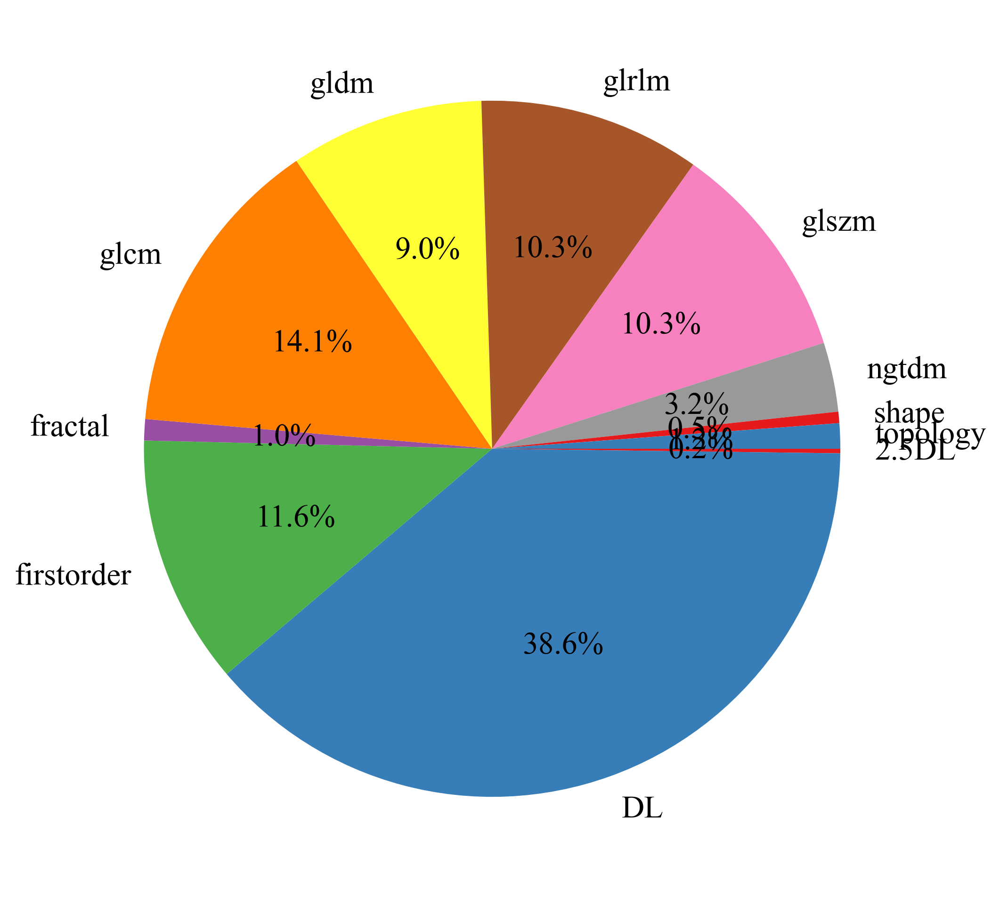

In [57]:
import matplotlib.pyplot as plt
sorted_counts = pd.DataFrame([c.split('_')[-2] for c in rad_data.columns if c !='ID']).value_counts()
sorted_counts = pd.DataFrame(sorted_counts, columns=['count']).reset_index()
sorted_counts = sorted_counts.sort_values(0)
display(sorted_counts)
plt.pie(sorted_counts['count'], labels=[i for i in sorted_counts[0]], startangle=0,
        counterclock = False, autopct = '%.1f%%')
plt.savefig(f'img/{task_type}feature_ratio.svg', bbox_inches = 'tight')

## 标注数据

数据以csv格式进行存储，这里如果是其他格式，可以使用自定义函数读取出每个样本的结果。

要求label_data为一个`DataFrame`格式，包括ID列以及后续的labels列，可以是多列，支持Multi-Task。

In [58]:
label_data = pd.read_csv(labelf)
label_data['ID'] = label_data['ID'].map(lambda x: f"{x}.nii.gz" if not (f"{x}".endswith('.nii.gz') or  f"{x}".endswith('.nii')) else x)
label_data

,ID,label,group
0,sl_162.nii.gz,0,train
1,191.nii.gz,1,train
2,112.nii.gz,0,train
3,255.nii.gz,0,train
4,47.nii.gz,1,train
...,...,...,...
396,264.nii.gz,0,test
397,294.nii.gz,1,test
398,sl_229.nii.gz,0,test
399,346.nii.gz,1,test


## 特征拼接 

将标注数据`label_data`与`rad_data`进行合并，得到训练数据。

**注意：** 
1. 需要删掉ID这一列
2. 如果发现数据少了，需要自行检查数据是否匹配。

In [59]:
from onekey_algo.custom.utils import print_join_info

print_join_info(rad_data, label_data)
combined_data = pd.merge(rad_data, label_data, on=['ID'], how='inner')
ids = combined_data['ID']
combined_data = combined_data.drop(['ID'], axis=1)
print(combined_data[labels].value_counts())
combined_data.columns

[2026-09-05 21:25:30 - <frozen onekey_algo.custom.utils>:  60]	INFO	ID特征完全匹配！


label
0        220
1        181
dtype: int64


Index(['A_exponential_firstorder_10Percentile',
       'A_exponential_firstorder_90Percentile',
       'A_exponential_firstorder_Energy', 'A_exponential_firstorder_Entropy',
       'A_exponential_firstorder_InterquartileRange',
       'A_exponential_firstorder_Kurtosis', 'A_exponential_firstorder_Maximum',
       'A_exponential_firstorder_Mean',
       'A_exponential_firstorder_MeanAbsoluteDeviation',
       'A_exponential_firstorder_Median',
       ...
       'DL_2041', 'DL_2042', 'DL_2043', 'DL_2044', 'DL_2045', 'DL_2046',
       'DL_2047', 'DL_2048', 'label', 'group'],
      dtype='object', length=5286)

## 获取到数据的统计信息

1. count，统计样本个数。
2. mean、std, 对应特征的均值、方差
3. min, 25%, 50%, 75%, max，对应特征的最小值，25,50,75分位数，最大值。

In [60]:
combined_data.describe()

,A_exponential_firstorder_10Percentile,A_exponential_firstorder_90Percentile,A_exponential_firstorder_Energy,A_exponential_firstorder_Entropy,A_exponential_firstorder_InterquartileRange,A_exponential_firstorder_Kurtosis,A_exponential_firstorder_Maximum,A_exponential_firstorder_Mean,A_exponential_firstorder_MeanAbsoluteDeviation,A_exponential_firstorder_Median,...,DL_2040,DL_2041,DL_2042,DL_2043,DL_2044,DL_2045,DL_2046,DL_2047,DL_2048,label
count,401.000,401.000,4.010e+02,401.000,401.000,401.000,401.000,401.000,401.000,401.000,...,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000
mean,33.884,151.673,7.169e+09,4.268,54.725,206.254,1434.221,86.515,44.907,67.248,...,3.778,1.399,1.294,0.964,0.946,1.657,1.216,1.581,0.930,0.451
std,31.652,214.539,1.316e+10,1.141,87.814,516.826,1380.580,93.214,66.099,67.776,...,3.395,0.723,0.652,0.280,0.212,0.983,0.557,0.837,0.255,0.498
min,2.514,18.503,2.128e+07,0.180,1.286,2.187,20.176,16.492,0.850,11.059,...,0.125,0.492,0.509,0.480,0.451,0.423,0.511,0.451,0.441,0.000
25%,17.620,75.613,4.967e+08,3.848,23.945,8.359,275.153,46.685,17.619,37.226,...,0.702,0.795,0.810,0.770,0.807,0.781,0.836,0.808,0.739,0.000
50%,25.126,104.941,1.949e+09,4.443,37.219,26.189,691.360,64.725,28.655,51.051,...,3.080,1.205,1.089,0.888,0.944,1.487,1.027,1.497,0.870,0.000
75%,37.835,166.369,7.364e+09,4.950,58.812,194.243,2967.790,94.690,51.820,72.740,...,5.980,1.762,1.607,1.086,1.052,2.269,1.411,2.219,1.060,1.000
max,279.472,2915.905,8.418e+10,6.583,1204.686,7034.366,4515.832,1207.134,822.916,873.771,...,16.525,3.513,5.044,2.154,2.093,4.608,4.317,4.102,2.019,1.000


## Z-score

`normalize_df` 为onekey中正则化的API，将数据变化到0均值1方差。正则化的方法为

$column = \frac{column - mean}{std}$

In [61]:
from onekey_algo.custom.components.comp1 import normalize_df
data = normalize_df(combined_data, not_norm=labels, group=group_info, use_train=True)
data = data.dropna(axis=1)
data.describe()

[2026-09-05 21:25:36 - <frozen onekey_algo.custom.components.comp1>: 283]	INFO	正在使用训练集预定数据进行标准化。


,A_exponential_firstorder_10Percentile,A_exponential_firstorder_90Percentile,A_exponential_firstorder_Energy,A_exponential_firstorder_Entropy,A_exponential_firstorder_InterquartileRange,A_exponential_firstorder_Kurtosis,A_exponential_firstorder_Maximum,A_exponential_firstorder_Mean,A_exponential_firstorder_MeanAbsoluteDeviation,A_exponential_firstorder_Median,...,DL_2040,DL_2041,DL_2042,DL_2043,DL_2044,DL_2045,DL_2046,DL_2047,DL_2048,label
count,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000,...,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000
mean,-0.022,-0.003,0.008,0.064,-0.002,0.016,0.059,-0.003,0.009,-0.009,...,0.037,0.044,0.018,0.021,0.022,0.046,0.032,0.033,-0.012,0.451
std,0.921,0.915,1.003,0.958,0.915,0.951,1.029,0.919,0.930,0.916,...,0.997,1.003,0.977,0.986,0.983,1.001,1.027,0.975,0.976,0.498
min,-0.935,-0.571,-0.536,-3.369,-0.558,-0.359,-0.994,-0.694,-0.611,-0.769,...,-1.035,-1.214,-1.160,-1.682,-2.278,-1.211,-1.267,-1.283,-1.885,0.000
25%,-0.495,-0.327,-0.500,-0.289,-0.322,-0.348,-0.804,-0.396,-0.375,-0.415,...,-0.866,-0.795,-0.708,-0.660,-0.622,-0.847,-0.669,-0.868,-0.741,0.000
50%,-0.277,-0.202,-0.390,0.211,-0.184,-0.315,-0.494,-0.218,-0.220,-0.228,...,-0.168,-0.227,-0.289,-0.246,0.013,-0.127,-0.317,-0.065,-0.240,0.000
75%,0.093,0.060,0.023,0.637,0.041,-0.006,1.202,0.077,0.106,0.065,...,0.684,0.546,0.486,0.452,0.514,0.670,0.390,0.775,0.485,1.000
max,7.122,11.793,5.874,2.007,11.977,12.585,2.355,11.048,10.961,10.887,...,3.779,2.974,5.640,4.207,5.346,3.053,5.746,2.969,4.158,1.000


## 统计检验

通过ttest或者utest进行特征筛选。

**注意** ：此步骤不是论文的标配，所以用不用在自己的选择，可以通过修改pvalue的值进行调整，默认是0.05为显著。

In [62]:
import seaborn as sns
from onekey_algo.custom.components.stats import clinic_stats

sub_data = data[data['group'] == 'train']
stats = clinic_stats(sub_data, stats_columns=list(data.columns[0:-2]), label_column=labels[0], 
                     continuous_columns=list(data.columns[0:-2]), verbose=False)
stats

,feature_name,-label=ALL,-label=0,-label=1,pvalue
0,A_exponential_firstorder_10Percentile,0.000±1.000,-0.074±0.878,0.083±1.118,0.201
1,A_exponential_firstorder_90Percentile,0.000±1.000,-0.115±0.422,0.129±1.377,0.077
2,A_exponential_firstorder_Energy,0.000±1.000,0.028±0.998,-0.032±1.005,0.286
3,A_exponential_firstorder_Entropy,-0.000±1.000,-0.070±0.973,0.078±1.027,0.092
4,A_exponential_firstorder_InterquartileRange,0.000±1.000,-0.114±0.414,0.127±1.380,0.118
...,...,...,...,...,...
5279,DL_2044,0.000±1.000,0.079±1.045,-0.088±0.943,0.081
5280,DL_2045,-0.000±1.000,0.011±0.987,-0.012±1.018,0.717
5281,DL_2046,-0.000±1.000,-0.012±0.916,0.013±1.090,0.842
5282,DL_2047,-0.000±1.000,0.026±1.020,-0.029±0.980,0.713


#### 输出特征分布的图

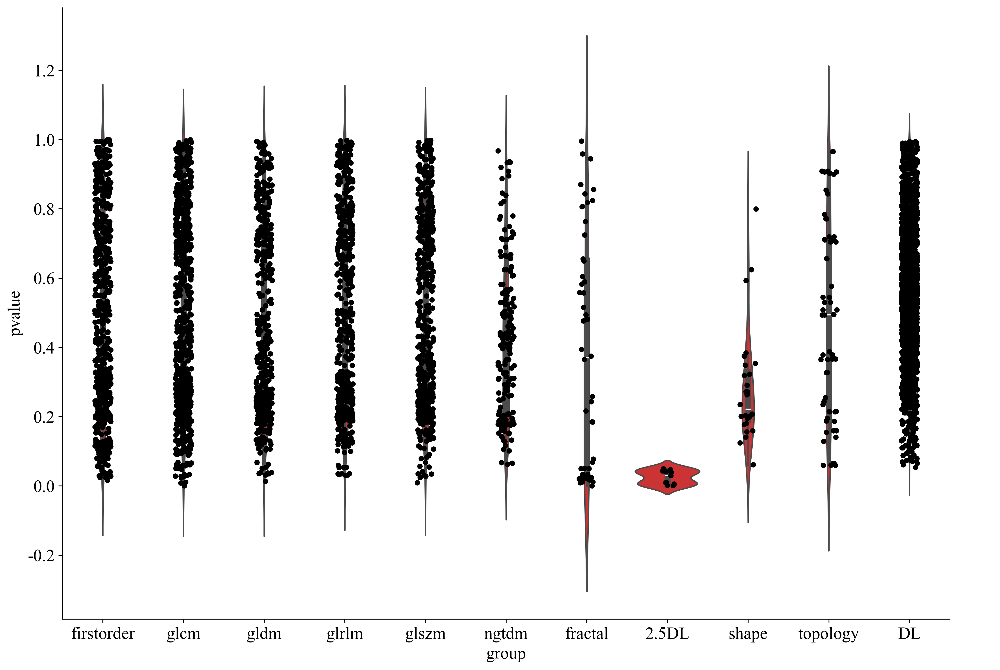

In [63]:
import matplotlib.pyplot as plt

def map2float(x):
    try:
        return float(str(x)[1:])
    except:
        return 1

stats[['pvalue']] = stats[['pvalue']].applymap(map2float)
stats[['group']] = stats[['feature_name']].applymap(lambda x: x.split('_')[-2])
stats = stats[['feature_name', 'pvalue', 'group']]
g = sns.catplot(x="group", y="pvalue", data=stats, kind="violin")
g.fig.set_size_inches(15,10)
sns.stripplot(x="group", y="pvalue", data=stats, ax=g.ax, color='black')
plt.savefig(f'img/{task_type}feature_stats.svg', bbox_inches = 'tight')

#### 调整pvalue进行筛选。

In [64]:
pvalue = get_param_in_cwd('p_value', 0.05)
sel_feature = list(stats[stats['pvalue'] < pvalue]['feature_name']) + labels + [group_info]
data = data[sel_feature]
data

,A_exponential_glszm_LargeAreaLowGrayLevelEmphasis,A_log_sigma_1_0_mm_3D_firstorder_Median,A_original_firstorder_Kurtosis,A_original_fractal_Lacunarity40Percentile,A_original_fractal_Lacunarity60Percentile,A_original_fractal_Lacunarity70Percentile,A_original_fractal_Lacunarity80Percentile,A_original_fractal_Lacunarity90Percentile,A_original_fractal_LacunarityMax,A_original_fractal_LacunarityMean,...,V_wavelet_LLL_firstorder_Minimum,2.5DL_feature10,2.5DL_feature7,2.5DL_feature5,V_wavelet_HLL_firstorder_Kurtosis,2.5DL_feature1,2.5DL_feature3,2.5DL_feature4,label,group
7,-0.136,0.837,0.052,0.524,0.345,0.211,0.043,-0.122,-0.122,0.126,...,-0.242,-1.389,0.583,-0.090,-2.854,-0.729,-1.893,0.174,0,test
12,-0.136,0.385,-0.165,0.326,0.030,-0.036,-0.124,-0.133,-0.133,0.039,...,-0.990,-0.443,-0.996,0.319,1.493,-0.851,-0.445,-0.201,1,test
13,-0.141,0.090,-0.255,-0.938,-0.850,-0.843,-0.983,-0.893,-0.893,-0.951,...,0.050,0.861,-0.611,-0.481,1.167,-0.295,0.493,-0.311,0,test
14,-0.138,0.099,-0.156,-0.502,-0.357,-0.640,-0.717,-0.761,-0.761,-0.649,...,-0.309,-0.490,0.380,1.118,0.900,-0.170,1.136,0.004,0,test
31,-0.141,-2.746,-0.274,0.507,0.694,1.252,1.577,1.161,1.161,0.873,...,0.272,-0.137,2.049,1.260,0.099,1.413,-0.864,-1.627,0,test
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396,-0.130,-0.015,-0.311,-0.104,-0.373,-0.450,-0.640,-0.672,-0.672,-0.491,...,0.736,0.617,-0.527,0.086,1.611,-0.408,0.967,-0.125,0,train
397,-0.141,-4.614,-0.300,-1.057,-1.338,-1.321,-0.855,-1.057,-1.057,-1.150,...,1.238,1.722,-0.756,-0.824,0.385,-0.647,-0.293,-0.166,0,train
398,-0.141,0.828,-0.303,-0.411,-0.798,-0.898,-0.874,-0.785,-0.785,-0.707,...,0.589,0.878,-0.965,0.587,0.101,0.236,-0.353,1.393,0,train
399,-0.141,0.166,-0.184,0.404,-0.094,-0.148,-0.012,-0.288,-0.288,0.173,...,-0.747,-1.714,0.909,-0.784,-0.173,-0.130,0.796,0.828,0,train


### 相关系数

计算相关系数的方法有3种可供选择
1. pearson （皮尔逊相关系数）: standard correlation coefficient

2. kendall (肯德尔相关性系数) : Kendall Tau correlation coefficient

3. spearman (斯皮尔曼相关性系数): Spearman rank correlation

三种相关系数参考：https://blog.csdn.net/zmqsdu9001/article/details/82840332

In [ ]:
# 相关系数视频
onekey_show('传统组学任务|相关系数')

In [65]:
pearson_corr = data[data['group'] == 'train'][[c for c in data.columns if c not in labels]].corr('pearson')
# kendall_corr = data.corr('kendall')
# spearman_corr = data.corr('spearman')

### 相关系数可视化

通过修改变量名，可以可视化不同相关系数下的相关矩阵。

**注意**：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [ ]:
import seaborn as sns
from onekey_algo.custom.components.comp1 import draw_matrix
if data.shape[1] < 100:
    plt.figure(figsize=(50.0, 40.0))
    # 选择可视化的相关系数
    draw_matrix(pearson_corr, annot=True, cmap='YlGnBu', cbar=False)
    plt.savefig(f'img/{task_type}feature_corr.svg', bbox_inches = 'tight')

### 聚类分析

通过修改变量名，可以可视化不同相关系数下的相聚类分析矩阵。

注意：当特征特别多的时候（大于100），尽量不要可视化，否则运行时间会特别长。

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

if data.shape[1] < 100:
    pp = sns.clustermap(pearson_corr, linewidths=.5, figsize=(50.0, 40.0), cmap='YlGnBu')
    plt.setp(pp.ax_heatmap.get_yticklabels(), rotation=0)
    plt.savefig(f'img/{task_type}feature_cluster.svg', bbox_inches = 'tight')

### 特征筛选 -- 相关系数

根据相关系数，对于相关性比较高的特征（一般文献取corr>0.9），两者保留其一。

```python
def select_feature(corr, threshold: float = 0.9, keep: int = 1, topn=10, verbose=False):
    """
    * corr, 相关系数矩阵。
    * threshold，筛选的相关系数的阈值，大于阈值的两者保留其一（可以根据keep修改，可以是其二...）。默认阈值为0.9
    * keep，可以选择大于相关系数，保留几个，默认只保留一个。
    * topn, 每次去掉多少重复特征。
    * verbose，是否打印日志
    """
```

In [ ]:
# 特征筛选视频
onekey_show('传统组学任务|特征筛选')

In [66]:
from onekey_algo.custom.components.comp1 import select_feature, select_feature_mrmr
sel_feature = select_feature(pearson_corr, threshold=0.9, topn=128, verbose=False)
if get_param_in_cwd('mrmr_sel_feature_num', None) is not None:
    num_features = min(len(sel_feature), get_param_in_cwd('mrmr_sel_feature_num'))
    sel_feature = select_feature_mrmr(data[data['group'] == 'train'][sel_feature + labels], num_features=num_features)
sel_feature += labels + [group_info]
sel_feature

['2.5DL_feature8',
 '2.5DL_feature6',
 '2.5DL_feature9',
 'A_exponential_glszm_LargeAreaLowGrayLevelEmphasis',
 'V_original_fractal_LacunaritySTD',
 '2.5DL_feature3',
 'V_wavelet_LLL_glszm_LargeAreaHighGrayLevelEmphasis',
 'A_log_sigma_1_0_mm_3D_firstorder_Median',
 'A_squareroot_firstorder_Kurtosis',
 'V_wavelet_LLL_firstorder_Minimum',
 'V_wavelet_HLH_glszm_SmallAreaHighGrayLevelEmphasis',
 '2.5DL_feature5',
 'A_square_firstorder_Kurtosis',
 'V_wavelet_HLL_firstorder_Kurtosis',
 '2.5DL_feature4',
 '2.5DL_feature11',
 'A_original_glcm_ClusterShade',
 'V_log_sigma_1_0_mm_3D_firstorder_Mean',
 '2.5DL_feature7',
 '2.5DL_feature10',
 'V_gradient_glcm_Id',
 'A_wavelet_LHL_firstorder_Skewness',
 '2.5DL_feature1',
 'V_log_sigma_1_0_mm_3D_glcm_Idn',
 'V_wavelet_LLL_gldm_LargeDependenceHighGrayLevelEmphasis',
 '2.5DL_feature2',
 'A_original_fractal_LacunaritySTD',
 'V_wavelet_HLL_glcm_Idn',
 'V_wavelet_LLL_glcm_Idn',
 'label',
 'group']

### 过滤特征

通过`sel_feature`过滤出筛选出来的特征。

In [67]:
sel_data = data[sel_feature]
sel_data.describe()

,2.5DL_feature8,2.5DL_feature6,2.5DL_feature9,A_exponential_glszm_LargeAreaLowGrayLevelEmphasis,V_original_fractal_LacunaritySTD,2.5DL_feature3,V_wavelet_LLL_glszm_LargeAreaHighGrayLevelEmphasis,A_log_sigma_1_0_mm_3D_firstorder_Median,A_squareroot_firstorder_Kurtosis,V_wavelet_LLL_firstorder_Minimum,...,V_gradient_glcm_Id,A_wavelet_LHL_firstorder_Skewness,2.5DL_feature1,V_log_sigma_1_0_mm_3D_glcm_Idn,V_wavelet_LLL_gldm_LargeDependenceHighGrayLevelEmphasis,2.5DL_feature2,A_original_fractal_LacunaritySTD,V_wavelet_HLL_glcm_Idn,V_wavelet_LLL_glcm_Idn,label
count,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000,401.000,...,401.000,401.000,4.010e+02,401.000,401.000,401.000,401.000,401.000,401.000,401.000
mean,0.008,-0.012,0.047,-0.017,-0.028,-0.041,0.003,-0.002,-0.015,-0.049,...,-0.044,-0.010,5.569e-03,-0.004,0.050,-0.007,0.052,-0.010,0.006,0.451
std,1.022,0.903,1.037,0.918,0.984,1.042,0.904,0.995,0.928,1.006,...,0.958,0.956,1.014e+00,1.004,1.037,0.994,0.996,1.011,0.993,0.498
min,-2.568,-0.275,-0.940,-0.141,-1.933,-3.447,-0.342,-4.614,-0.410,-2.562,...,-0.948,-6.026,-2.727e+00,-3.400,-1.009,-4.834,-1.331,-3.078,-3.642,0.000
25%,-0.674,-0.199,-0.668,-0.141,-0.646,-0.684,-0.255,-0.239,-0.340,-0.753,...,-0.520,-0.319,-6.592e-01,-0.552,-0.749,-0.466,-0.765,-0.651,-0.415,0.000
50%,-0.045,-0.149,-0.282,-0.141,-0.223,-0.090,-0.113,0.304,-0.295,-0.027,...,-0.359,0.052,-4.640e-05,0.051,-0.202,0.249,-0.126,0.060,0.232,0.000
75%,0.716,-0.004,0.433,-0.139,0.376,0.593,0.066,0.537,-0.156,0.702,...,-0.122,0.332,7.536e-01,0.569,0.420,0.678,0.602,0.792,0.681,1.000
max,2.846,16.186,5.323,15.685,4.438,5.218,17.122,2.878,7.696,2.851,...,3.922,4.184,3.523e+00,3.129,4.985,2.120,4.343,2.209,2.017,1.000


### 样本可视化

根据特征和label信息，将rad features降维到2维，看不同的label样本在二维空间的分布。

**注意**：由于特征空间维度极高，降维难免会有损失，所以二维的可视化仅供参考。

目前支持的:

| **降维方法** | **Method名称**                                                 |
| ------------ | ------------------------------------------------------------ |
| LLE      | Standard LLE, Modified LLE                                   |
| PCA      | t-SNE, NCA                                                      |
| SVD      | Truncated SVD                                              |
| Model Based      | Random projection, Isomap, MDS, Random Trees,Spectral       |

In [ ]:
from onekey_algo.custom.components.comp1 import analysis_features
analysis_features(sel_data[sel_feature[:-2]], data[labels[0]], methods='t-SNE')

## 构建数据

将样本的训练数据X与监督信息y分离出来，并且对训练数据进行划分，一般的划分原则为80%-20%

In [68]:
import numpy as np
import onekey_algo.custom.components as okcomp

n_classes = 2
train_data = sel_data[(sel_data[group_info] == 'train')]
train_ids = ids[train_data.index]
train_data = train_data.reset_index()
train_data = train_data.drop('index', axis=1)
y_data = train_data[labels]
X_data = train_data.drop(labels + [group_info], axis=1)

test_data = sel_data[sel_data[group_info] != 'train']
test_ids = ids[test_data.index]
test_data = test_data.reset_index()
test_data = test_data.drop('index', axis=1)
y_test_data = test_data[labels]
X_test_data = test_data.drop(labels + [group_info], axis=1)

y_all_data = sel_data[labels]
X_all_data = sel_data.drop(labels + [group_info], axis=1)

column_names = X_data.columns
print(f"训练集样本数：{X_data.shape}, 验证集样本数：{X_test_data.shape}")

训练集样本数：(320, 29), 验证集样本数：(81, 29)


### Lasso

初始化Lasso模型，alpha为惩罚系数。具体的参数文档可以参考：[文档](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html?highlight=lasso#sklearn.linear_model.Lasso)

### 交叉验证

不同Lambda下的，特征的的权重大小。
```python
def lasso_cv_coefs(X_data, y_data, points=50, column_names: List[str] = None, **kwargs):
    """

    Args:
        X_data: 训练数据
        y_data: 监督数据
        points: 打印多少个点。默认50
        column_names: 列名，默认为None，当选择的数据很多的时候，建议不要添加此参数
        **kwargs: 其他用于打印控制的参数。

    """
 ```

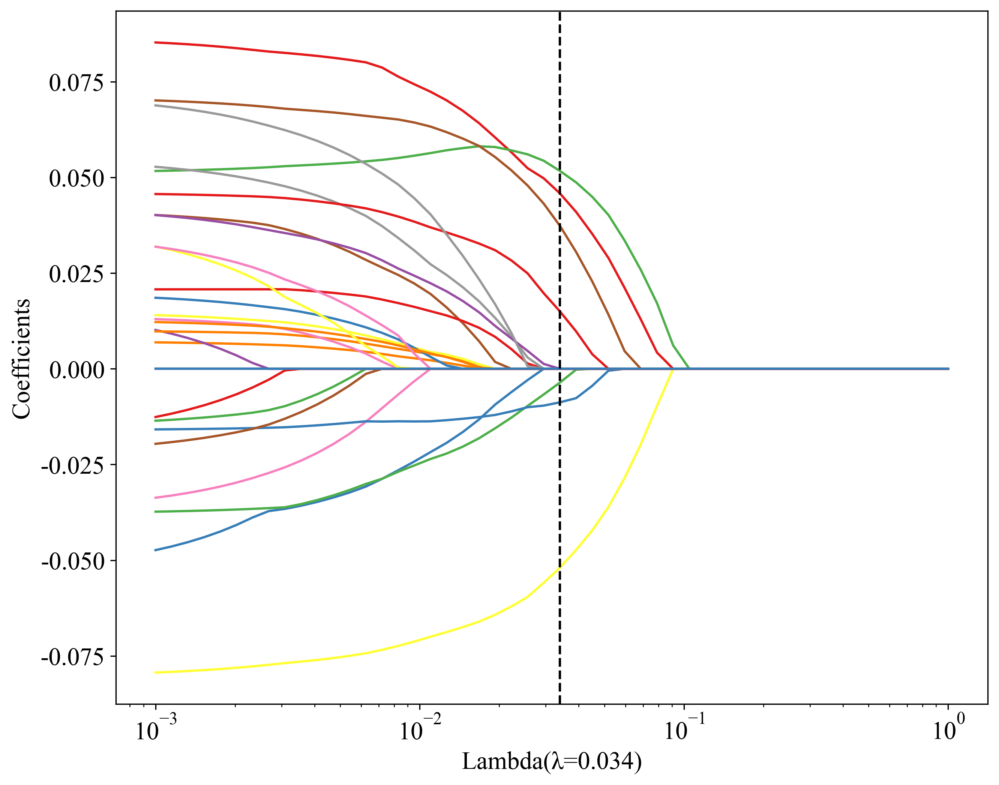

In [92]:
alpha = okcomp.comp1.lasso_cv_coefs(X_data, y_data, column_names=None, ensure_lastn=-40)
plt.savefig(f'img/{task_type}feature_lasso.svg', bbox_inches = 'tight')

### 模型效能

```python
def lasso_cv_efficiency(X_data, y_data, points=50, **kwargs):
    """

    Args:
        Xdata: 训练数据
        ydata: 测试数据
        points: 打印的数据密度
        **kwargs: 其他的图像样式
            # 数据点标记, fmt="o"
            # 数据点大小, ms=3
            # 数据点颜色, mfc="r"
            # 数据点边缘颜色, mec="r"
            # 误差棒颜色, ecolor="b"
            # 误差棒线宽, elinewidth=2
            # 误差棒边界线长度, capsize=2
            # 误差棒边界厚度, capthick=1
    Returns:
    """
 ```

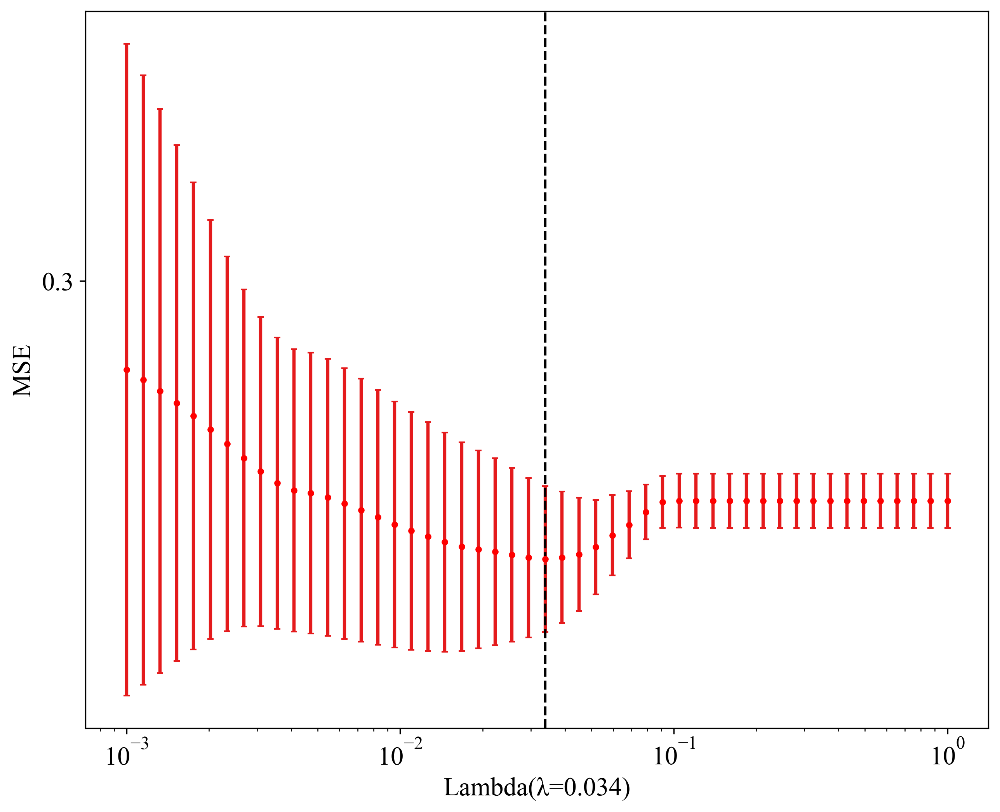

In [70]:
okcomp.comp1.lasso_cv_efficiency(X_data, y_data, points=50, y_major_locator=0.1)
plt.savefig(f'img/{task_type}feature_mse.svg', bbox_inches = 'tight')

### 惩罚系数

使用交叉验证的惩罚系数作为模型训练的基础。

In [71]:
from sklearn import linear_model

models = []
for label in labels:
    clf = linear_model.Lasso(alpha=alpha)
    clf.fit(X_data, y_data[label])
    models.append(clf)

### 特征筛选

筛选出其中coef > 0的特征。并且打印出相应的公式。

In [72]:
COEF_THRESHOLD = 1e-6 # 筛选的特征阈值
scores = []
selected_features = []
for label, model in zip(labels, models):
    feat_coef = [(feat_name, coef) for feat_name, coef in zip(column_names, model.coef_) 
                 if COEF_THRESHOLD is None or abs(coef) > COEF_THRESHOLD]
    selected_features.append([feat for feat, _ in feat_coef])
    formula = ' '.join([f"{coef:+.6f} * {feat_name}" for feat_name, coef in feat_coef])
    score = f"{label} = {model.intercept_} {'+' if formula[0] != '-' else ''} {formula}"
    scores.append(score)
    
print(scores[0])

label = 0.4718749999999999 + +0.073608 * 2.5DL_feature8 -0.023380 * 2.5DL_feature6 -0.024632 * 2.5DL_feature9 +0.002573 * V_original_fractal_LacunaritySTD -0.070837 * 2.5DL_feature3 +0.021440 * V_wavelet_LLL_glszm_LargeAreaHighGrayLevelEmphasis -0.001943 * A_log_sigma_1_0_mm_3D_firstorder_Median +0.015798 * V_wavelet_LLL_firstorder_Minimum -0.013765 * V_wavelet_HLH_glszm_SmallAreaHighGrayLevelEmphasis +0.055898 * 2.5DL_feature5 +0.004302 * V_wavelet_HLL_firstorder_Kurtosis +0.005100 * 2.5DL_feature4 +0.064040 * 2.5DL_feature11 +0.029709 * V_log_sigma_1_0_mm_3D_firstorder_Mean +0.037935 * 2.5DL_feature7 +0.004655 * 2.5DL_feature10 +0.023633 * A_wavelet_LHL_firstorder_Skewness +0.004691 * 2.5DL_feature1 +0.002102 * 2.5DL_feature2 +0.043208 * A_original_fractal_LacunaritySTD


### 特征权重

In [1]:
feat_coef = sorted(feat_coef, key=lambda x: x[1])
feat_coef_df = pd.DataFrame(feat_coef, columns=['feature_name', 'Coefficients'])
feat_coef_df.plot(x='feature_name', y='Coefficients', kind='barh')

plt.savefig(f'img/{task_type}feature_weights.svg', bbox_inches = 'tight')

NameError: name 'feat_coef' is not defined

### 进一步筛选特征

使用Lasso筛选出来的Coefficients比较高的特征作为训练数据。

In [28]:
X_data = X_data[selected_features[0]]
X_test_data = X_test_data[selected_features[0]]
X_data.columns

Index(['V_wavelet_LLL_firstorder_Minimum',
       'V_wavelet_HLL_glszm_SmallAreaHighGrayLevelEmphasis', 'DL_1814',
       'V_wavelet_HLH_glszm_SmallAreaHighGrayLevelEmphasis', 'DL_866',
       'A_original_fractal_LacunaritySTD', 'DL_779'],
      dtype='object')

## 模型筛选

根据筛选出来的数据，做模型的初步选择。当前主要使用到的是Onekey中的

1. SVM，支持向量机，引用参考。
2. KNN，K紧邻，引用参考。
3. Decision Tree，决策树，引用参考。
4. Random Forests, 随机森林，引用参考。
5. XGBoost, bosting方法。引用参考。
6. LightGBM, bosting方法，引用参考。

In [29]:
from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

model_names = get_param_in_cwd('ml_models')
models = okcomp.comp1.create_clf_model_none_overfit(model_names)

models['LR'] = LogisticRegression(penalty='none', max_iter=100)
models['SVM'] = SVC(probability=True, max_iter=100)
models['RandomForest'] = RandomForestClassifier(n_estimators=50, max_depth=5,
                                                    min_samples_split=4, random_state=0)
models['XGBoost'] = XGBClassifier(n_estimators=100, objective='binary:logistic', max_depth=3, min_child_weight=.2,
                                          use_label_encoder=False, eval_metric='error')
models['LightGBM'] = LGBMClassifier(n_estimators=20,  max_depth=4, min_child_weight=0.5,)
models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=20, max_depth=5, min_samples_split=2, random_state=0)
models['GradientBoosting'] = GradientBoostingClassifier(n_estimators=50, random_state=0)
models['AdaBoost'] = AdaBoostClassifier(n_estimators=10, random_state=0)
model_names = list(models.keys())

### 交叉验证

`n_trails`指定随机次数，每次采用的是80%训练，随机20%进行测试，找到最好的模型，以及对应的最好的数据划分。

[2026-09-04 13:54:01 - <frozen onekey_algo.custom.components.comp1>: 703]	WARNING	当cv=True的时候，采用的是交叉验证的模式，此时test_size的参数是不生效的，我们将忽略这个test_size设置。如果需要手动指定测试集比例，请修改cv=False。


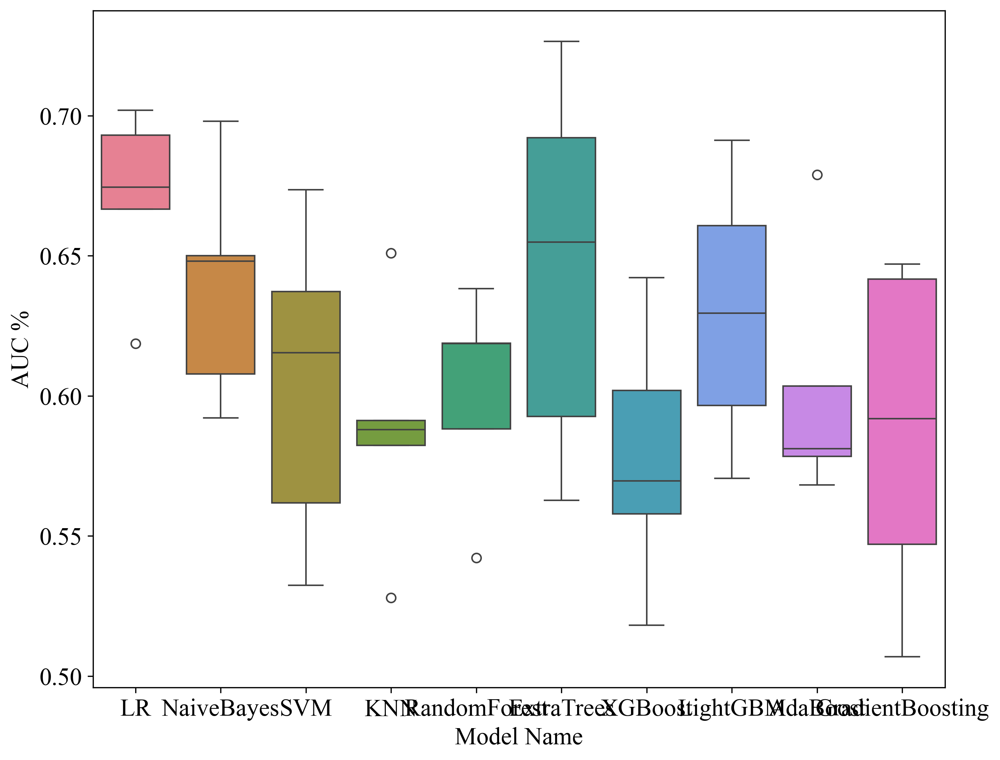

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import accuracy_score, roc_auc_score

# 随机使用n_trails次数据划分，找到最好的一次划分方法，并且保存在results中。
results = okcomp.comp1.get_bst_split(X_data, y_data, models, test_size=0.2, metric_fn=roc_auc_score, n_trails=5, cv=True, random_state=0)
_, (X_train_sel, X_test_sel, y_train_sel, y_test_sel) = results['results'][results['max_idx']]
X_train_sel, X_test_sel, y_train_sel, y_test_sel = X_data, X_test_data, y_data, y_test_data
trails, _ = zip(*results['results'])
cv_results = pd.DataFrame(trails, columns=model_names)
# 可视化每个模型在不同的数据划分中的效果。
sns.boxplot(data=cv_results)
plt.ylabel('AUC %')
plt.xlabel('Model Name')
plt.savefig(f'img/{task_type}model_cv.svg', bbox_inches = 'tight')

## 模型筛选

使用最好的数据划分，进行后续的模型研究。

**注意**: 一般情况下论文使用的是随机划分的数据，但也有些论文使用【刻意】筛选的数据划分。

In [31]:
import joblib
import json
from onekey_algo.custom.components.comp1 import plot_feature_importance, plot_learning_curve, smote_resample

from sklearn.ensemble import ExtraTreesClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from onekey_algo.custom.encrypt.security import dump_onekey, load_onekey

targets = []
os.makedirs('models', exist_ok=True)
for l in labels:
    new_models = okcomp.comp1.create_clf_model_none_overfit(model_names)
    # new_models['LR'] = LogisticRegression(penalty='none', max_iter=100)
    # new_models['SVM'] = SVC(probability=True, max_iter=100, kernel='linear')
    # new_models['RandomForest'] = RandomForestClassifier(n_estimators=5, max_depth=3,
    #                                                     min_samples_split=4, random_state=0)
    # new_models['XGBoost'] = XGBClassifier(n_estimators=6, objective='binary:logistic', max_depth=3, min_child_weight=.2,
    #                                           use_label_encoder=False, eval_metric='error')
    # new_models['LightGBM'] = LGBMClassifier(n_estimators=2,  max_depth=1, min_child_weight=0.5,)
    # new_models['ExtraTrees'] = ExtraTreesClassifier(n_estimators=60, max_depth=5, min_samples_split=2, random_state=0)
    # new_models['GradientBoosting'] = GradientBoostingClassifier(n_estimators=50, random_state=0)
    # new_models['AdaBoost'] = AdaBoostClassifier(n_estimators=10, random_state=0)
    # new_models['MLP'] = MLPClassifier(hidden_layer_sizes=(61, 128, 64, 32), max_iter=300, solver='sgd', random_state=0)
    model_names = list(new_models.keys())
    new_models = list(new_models.values())
    
    for mn, m in zip(model_names, new_models):
        X_train_smote, y_train_smote = X_train_sel, y_train_sel
        # 取消下一行的注释可以使用Smote进行采样，解决样本不均衡的问题。
        if get_param_in_cwd('use_smote', False):
            X_train_smote, y_train_smote = smote_resample(X_train_sel, y_train_sel)
        m.fit(X_train_smote, y_train_smote[l])
        # 输出模型特征重要性，只针对高级树模型有用
#         plot_feature_importance(m, selected_features[0], save_dir='img')
#         plot_learning_curve(m, X_train_sel, y_train_sel, title=f'Learning Curve {mn}')
#         plt.savefig(f"img/Rad_{mn}_learning_curve.svg", bbox_inches='tight')
        plt.show()
    targets.append(new_models)
    encoder = json.loads(open('results/norm_info.json', encoding='utf-8-sig').read())
    dump_onekey({'TYPE':'WEBUI',
                 'data': pd.concat([ids, combined_data[selected_features[0]]], axis=1),
                 'models': {mn:nm for mn, nm in zip(model_names, new_models)},
                 'encoder': {fname: encoder[fname] for fname in selected_features[0]},
                 'feature_config': selected_features[0]},
                save_path=f'web/config')

## 预测结果

* predictions，二维数据，每个label对应的每个模型的预测结果。
* pred_scores，二维数据，每个label对应的每个模型的预测概率值。

In [32]:
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OneHotEncoder
from onekey_algo.custom.components.delong import calc_95_CI
from onekey_algo.custom.components.metrics import analysis_pred_binary

predictions = [[(model.predict(X_train_sel), model.predict(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]
pred_scores = [[(model.predict_proba(X_train_sel), model.predict_proba(X_test_sel)) 
                for model in target] for label, target in zip(labels, targets)]

metric = []
pred_sel_idx = []
for label, prediction, scores in zip(labels, predictions, pred_scores):
    pred_sel_idx_label = []
    for mname, (train_pred, test_pred), (train_score, test_score) in zip(model_names, prediction, scores):
        # 计算训练集指数
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_train_sel[label], 
                                                                                              train_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"train"))
                 
        # 计算验证集指标
        acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres = analysis_pred_binary(y_test_sel[label], 
                                                                                              test_score[:, 1])
        ci = f"{ci[0]:.4f} - {ci[1]:.4f}"
        metric.append((mname, acc, auc, ci, tpr, tnr, ppv, npv, precision, recall, f1, thres, f"test"))
        # 计算thres对应的sel idx
        pred_sel_idx_label.append(np.logical_or(test_score[:, 0] >= thres, test_score[:, 1] >= thres))
    
    pred_sel_idx.append(pred_sel_idx_label)
metric = pd.DataFrame(metric, index=None, columns=['model_name', 'Accuracy', 'AUC', '95% CI',
                                                   'Sensitivity', 'Specificity', 
                                                   'PPV', 'NPV', 'Precision', 'Recall', 'F1',
                                                   'Threshold', 'Task'])
metric

,model_name,Accuracy,AUC,95% CI,Sensitivity,Specificity,PPV,NPV,Precision,Recall,F1,Threshold,Task
0,LR,0.653,0.698,0.6417 - 0.7551,0.656,0.651,0.627,0.679,0.627,0.656,0.641,0.492,train
1,LR,0.654,0.724,0.6100 - 0.8371,0.767,0.588,0.523,0.811,0.523,0.767,0.622,0.447,test
2,NaiveBayes,0.647,0.681,0.6224 - 0.7386,0.815,0.497,0.591,0.750,0.591,0.815,0.685,0.466,train
3,NaiveBayes,0.654,0.663,0.5376 - 0.7878,0.767,0.588,0.523,0.811,0.523,0.767,0.622,0.478,test
4,SVM,0.738,0.792,0.7436 - 0.8412,0.735,0.740,0.716,0.758,0.716,0.735,0.725,0.474,train
5,SVM,0.642,0.655,0.5310 - 0.7788,0.667,0.627,0.513,0.762,0.513,0.667,0.580,0.460,test
6,KNN,0.678,0.748,0.6974 - 0.7982,0.669,0.686,0.656,0.699,0.656,0.669,0.662,0.600,train
7,KNN,0.617,0.611,0.4899 - 0.7323,0.567,0.647,0.486,0.717,0.486,0.567,0.523,0.600,test
8,RandomForest,0.759,0.828,0.7837 - 0.8718,0.728,0.787,0.753,0.764,0.753,0.728,0.741,0.471,train
9,RandomForest,0.593,0.671,0.5489 - 0.7929,0.867,0.431,0.473,0.846,0.473,0.867,0.612,0.390,test


### 绘制曲线

绘制的不同模型的准确率柱状图和折线图曲线。

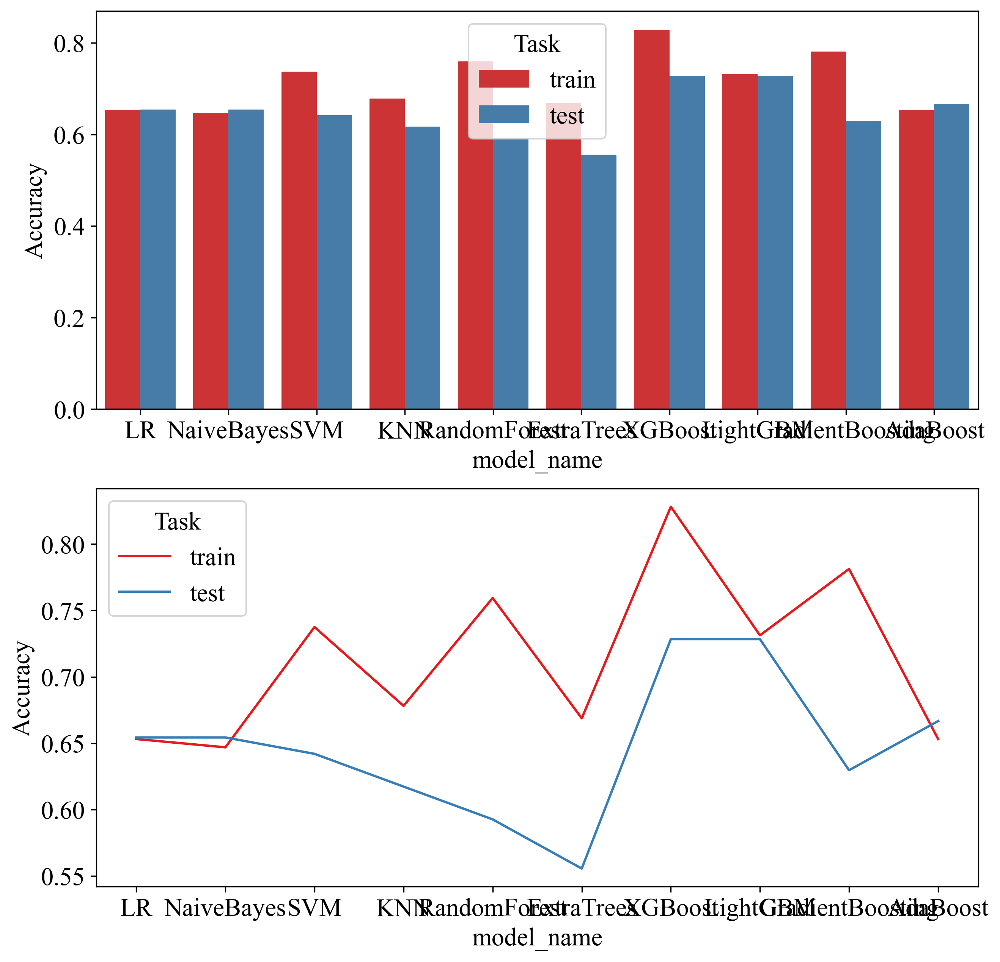

In [33]:
import seaborn as sns

plt.figure(figsize=(10, 10))
plt.subplot(211)
sns.barplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.subplot(212)
sns.lineplot(x='model_name', y='Accuracy', data=metric, hue='Task')
plt.savefig(f'img/{task_type}model_acc.svg', bbox_inches = 'tight')

### 绘制ROC曲线
确定最好的模型，并且绘制曲线。

```python
def draw_roc(y_test, y_score, title='ROC', labels=None):
```

`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

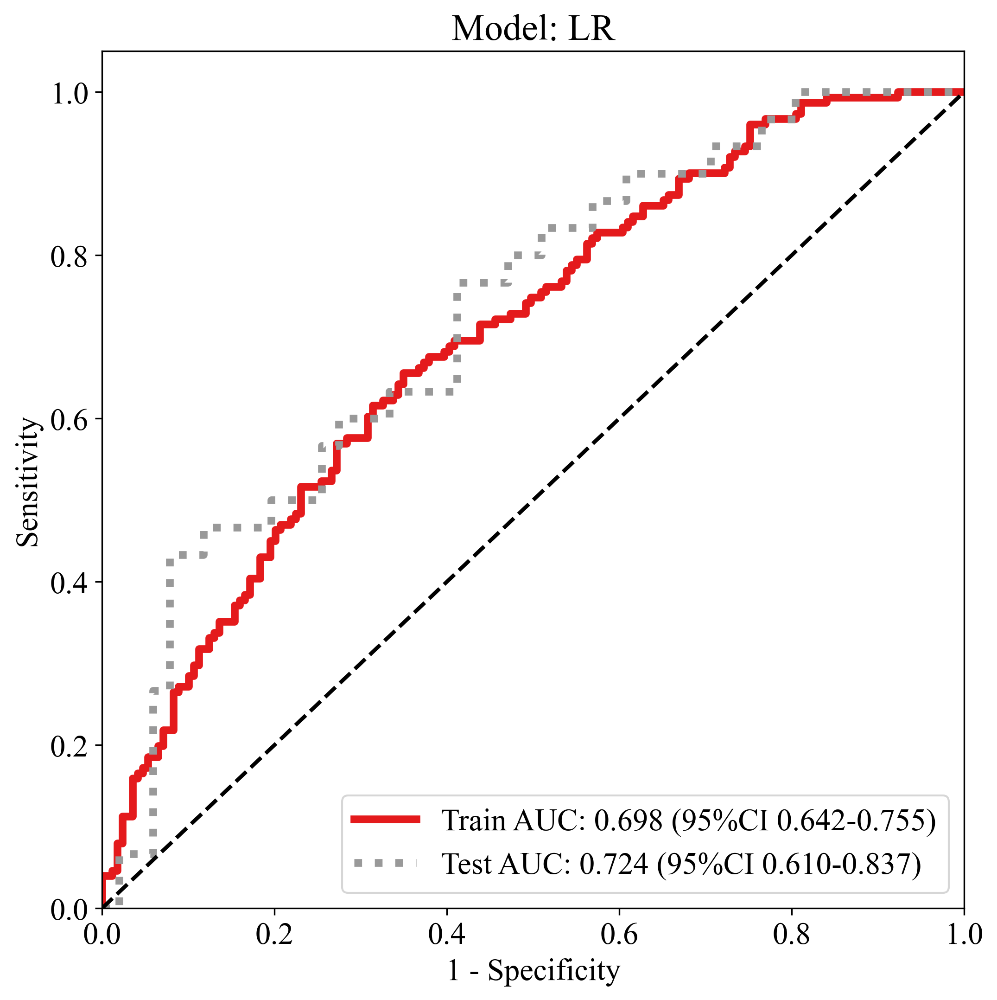

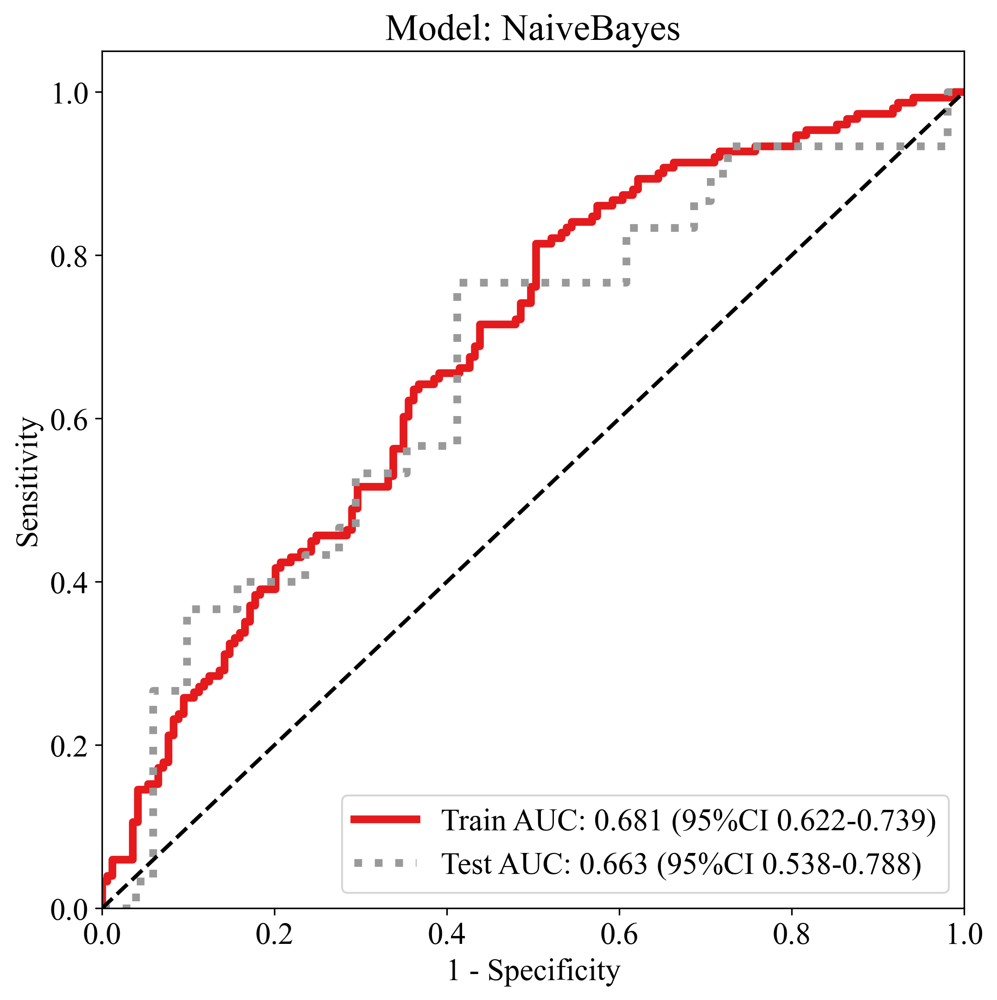

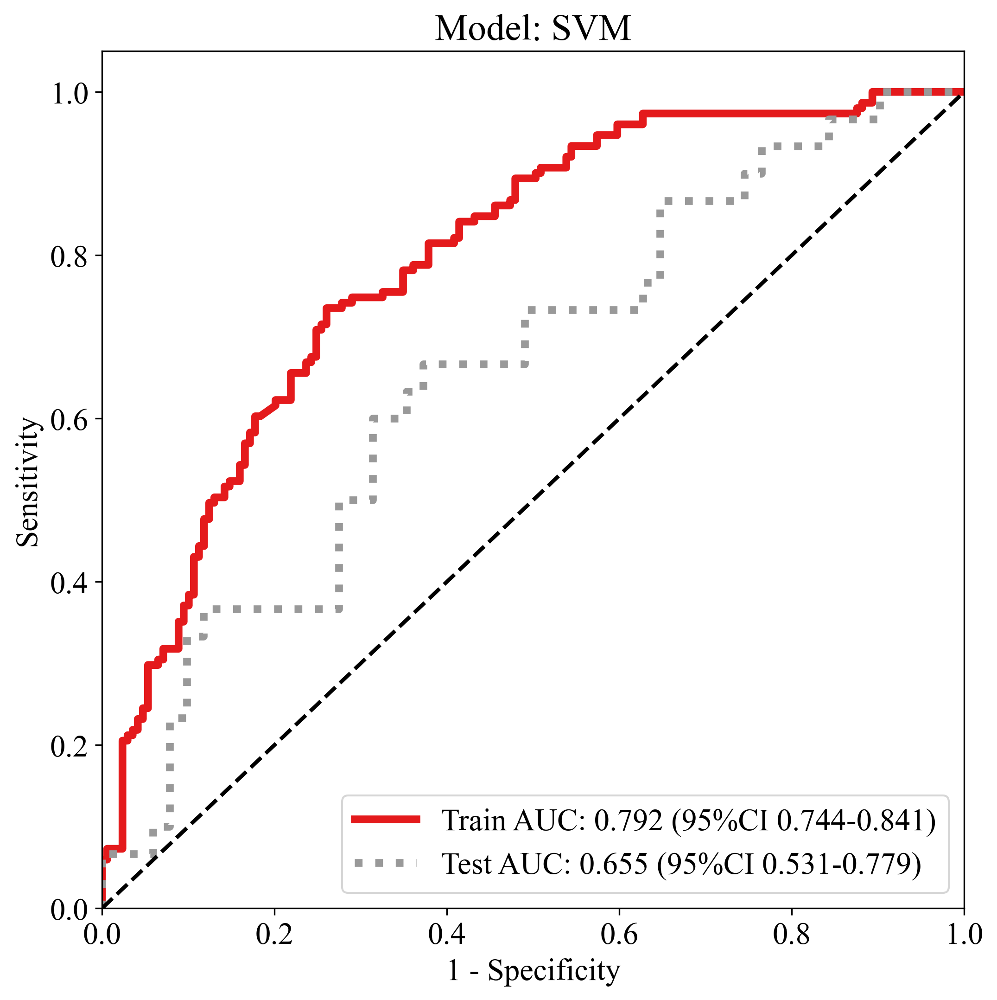

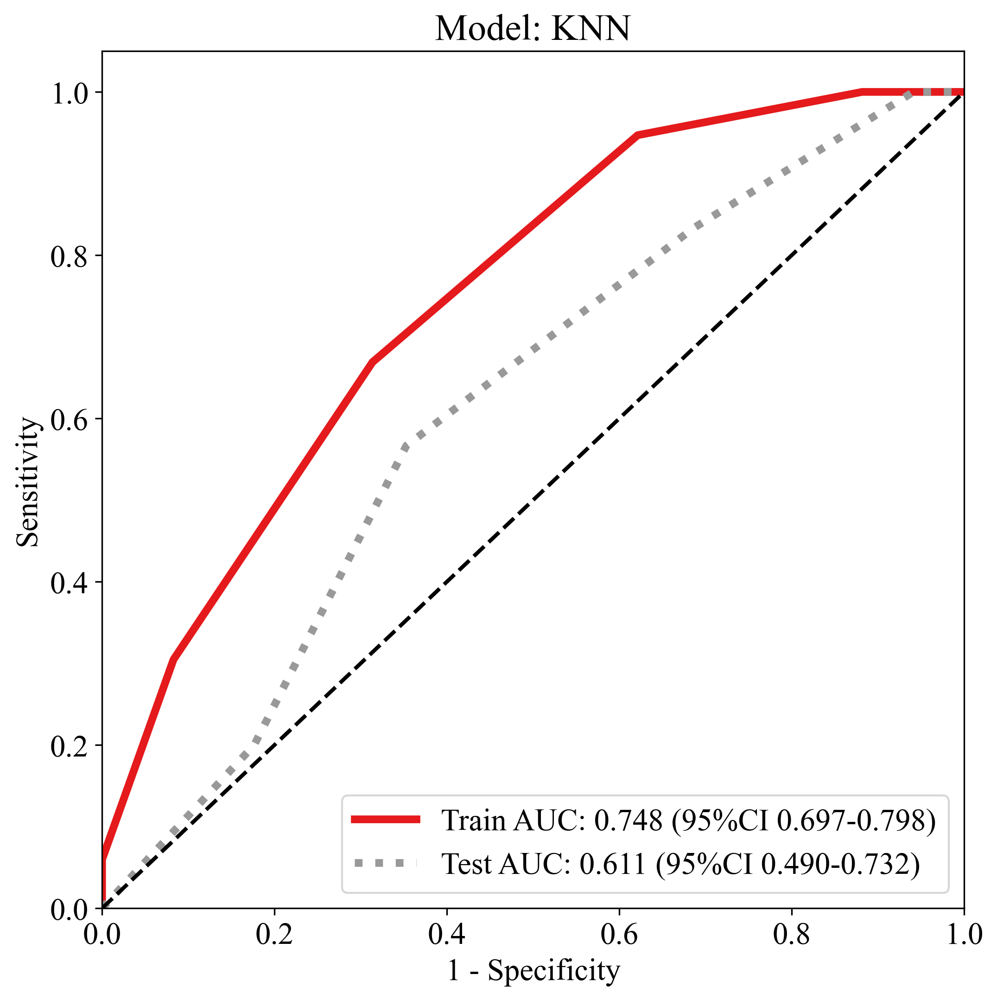

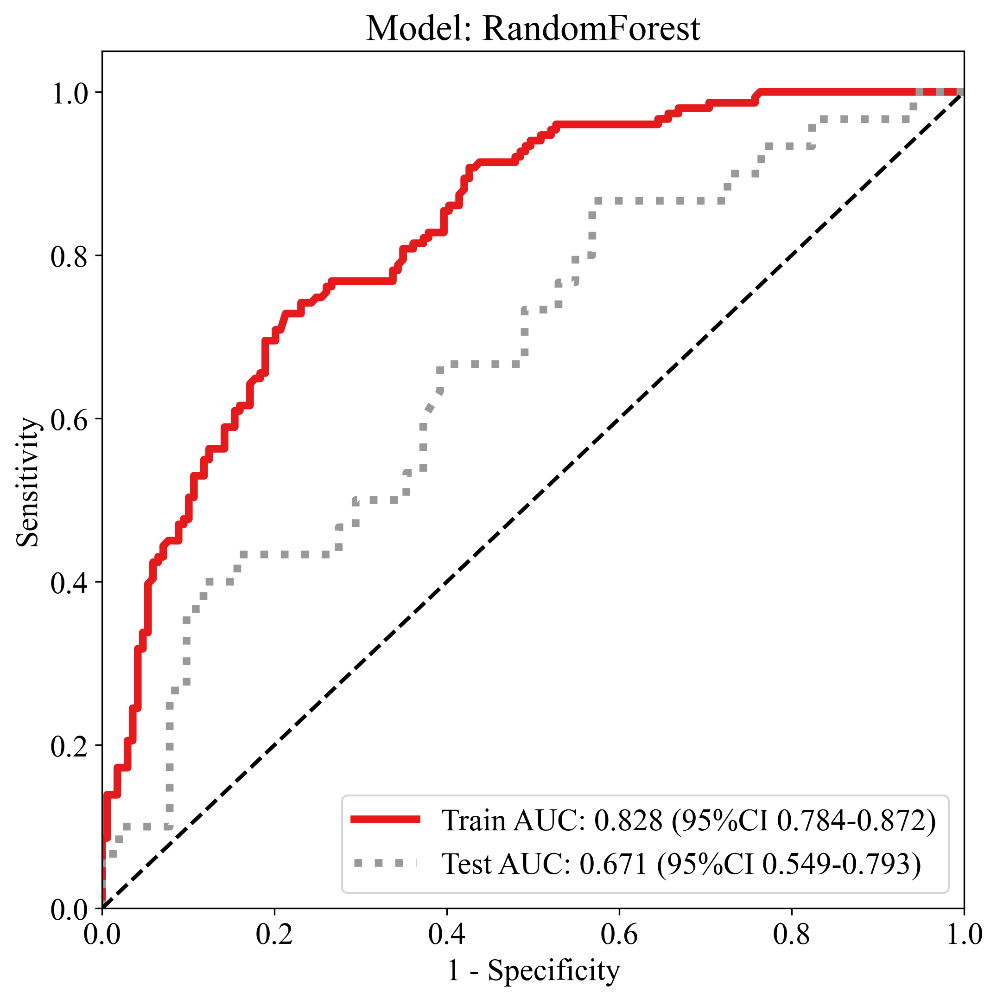

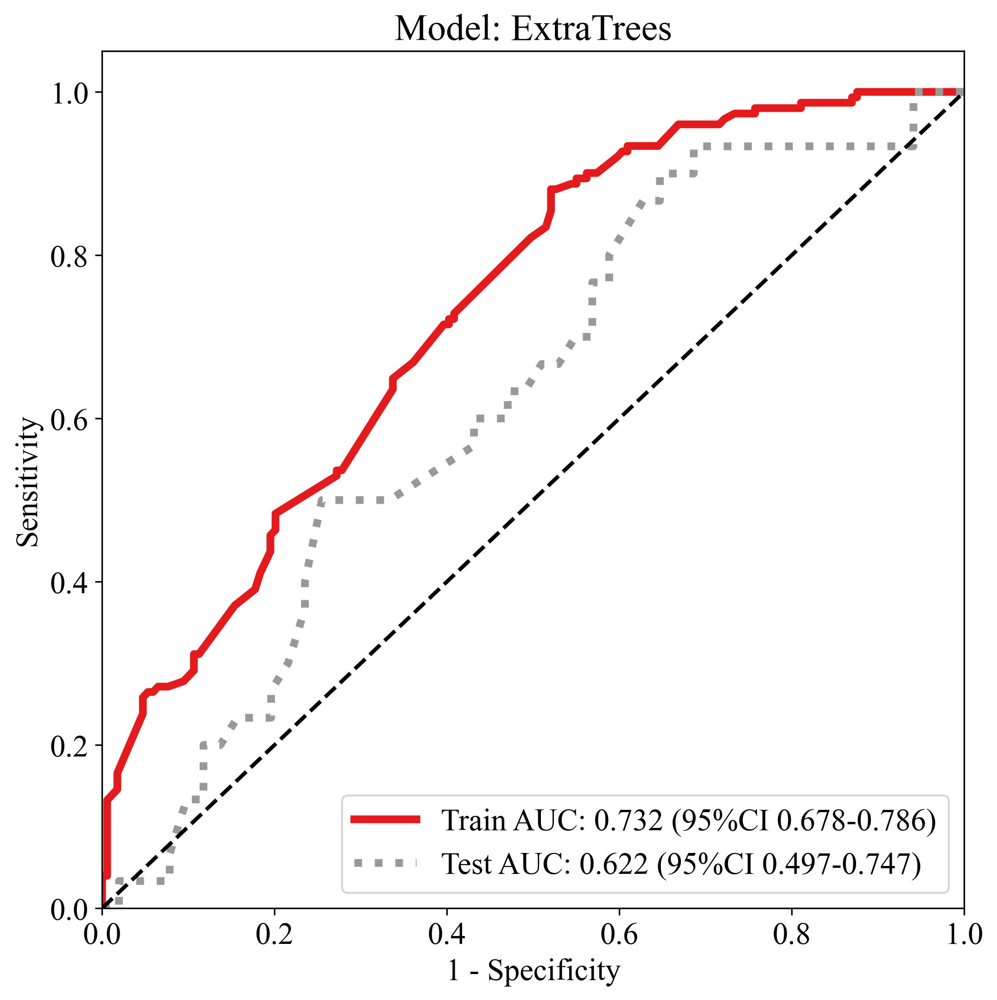

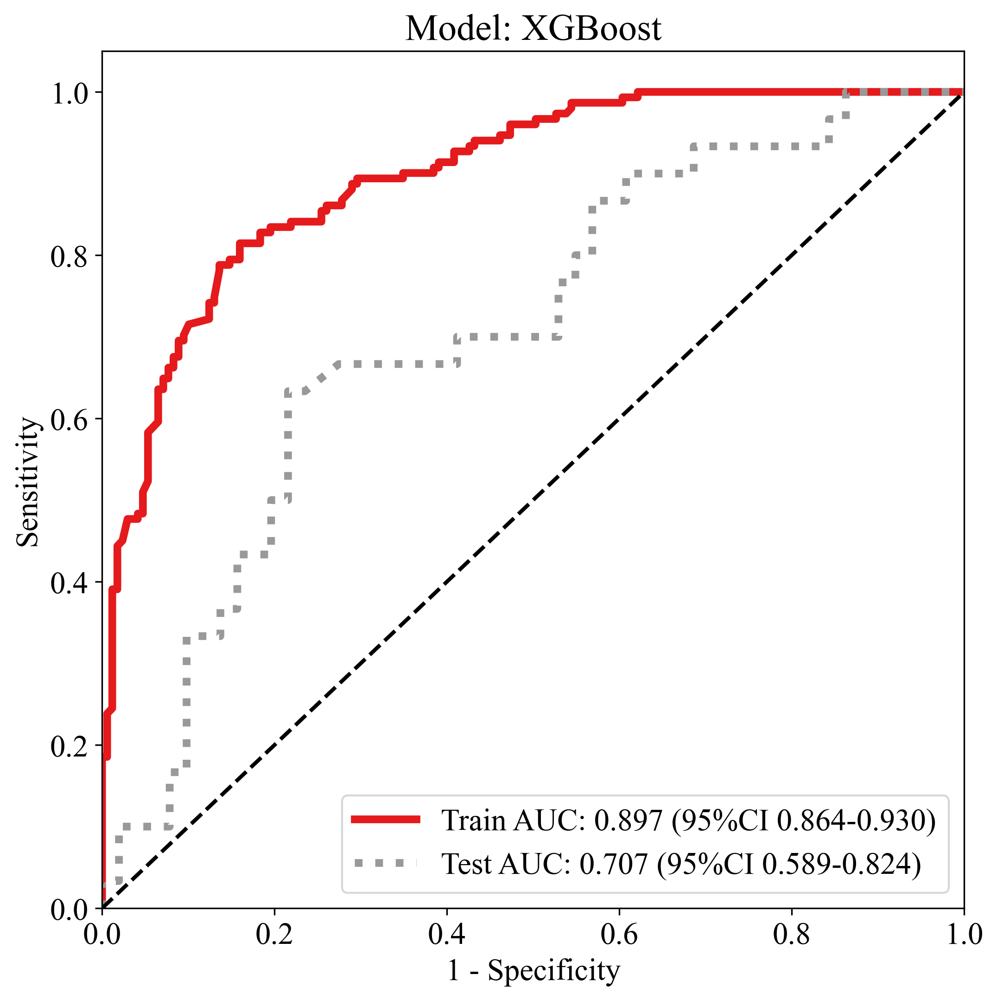

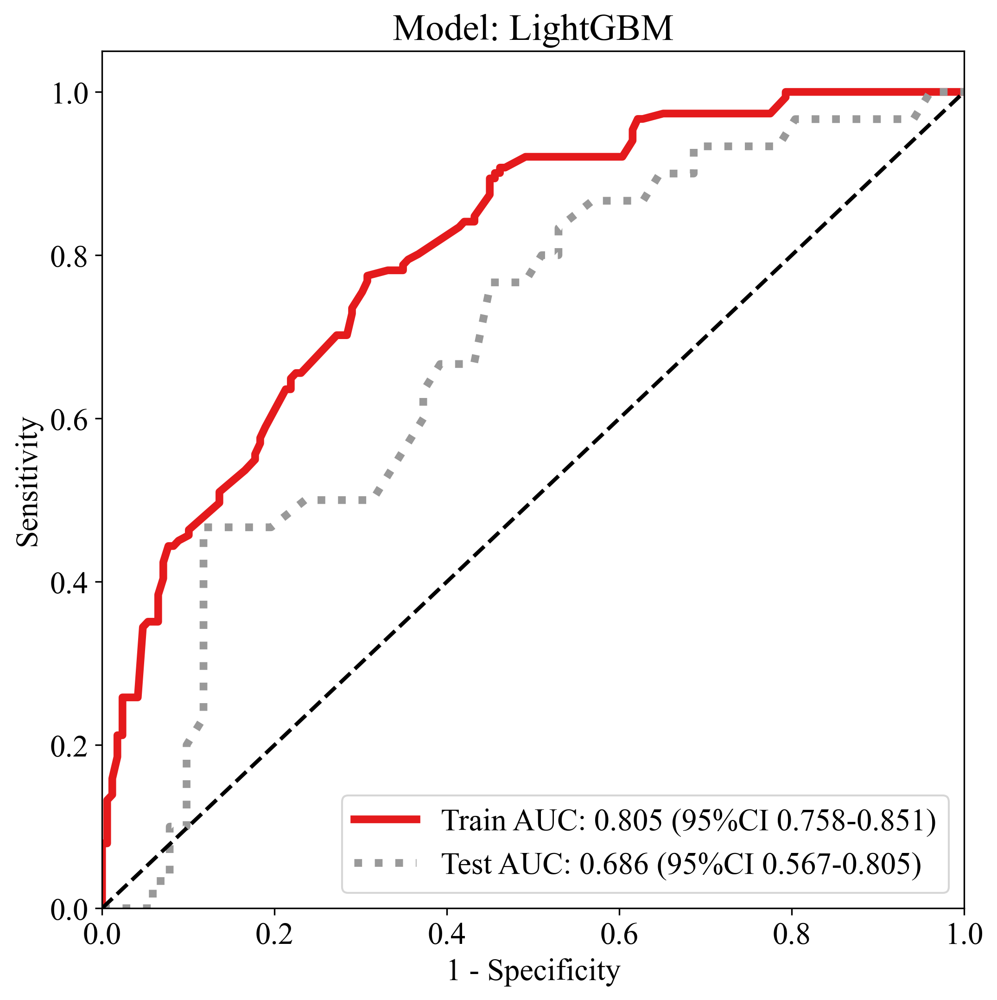

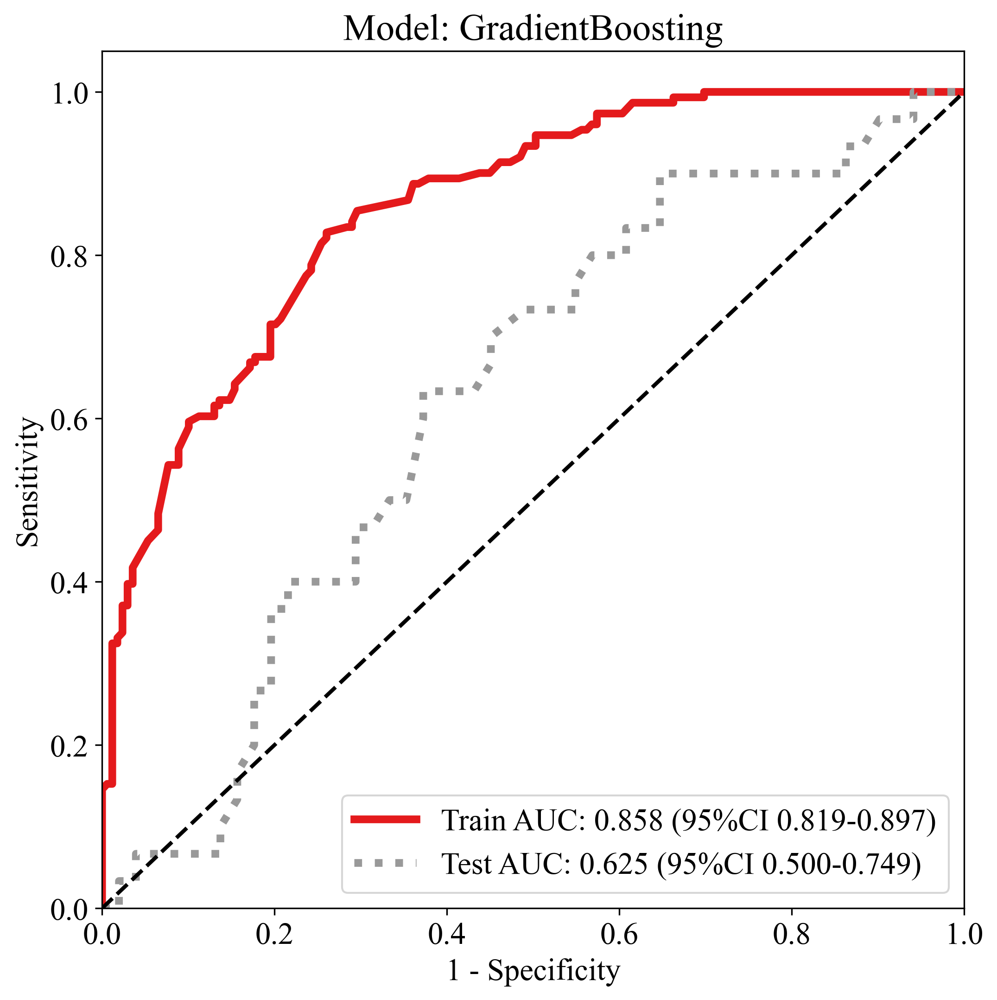

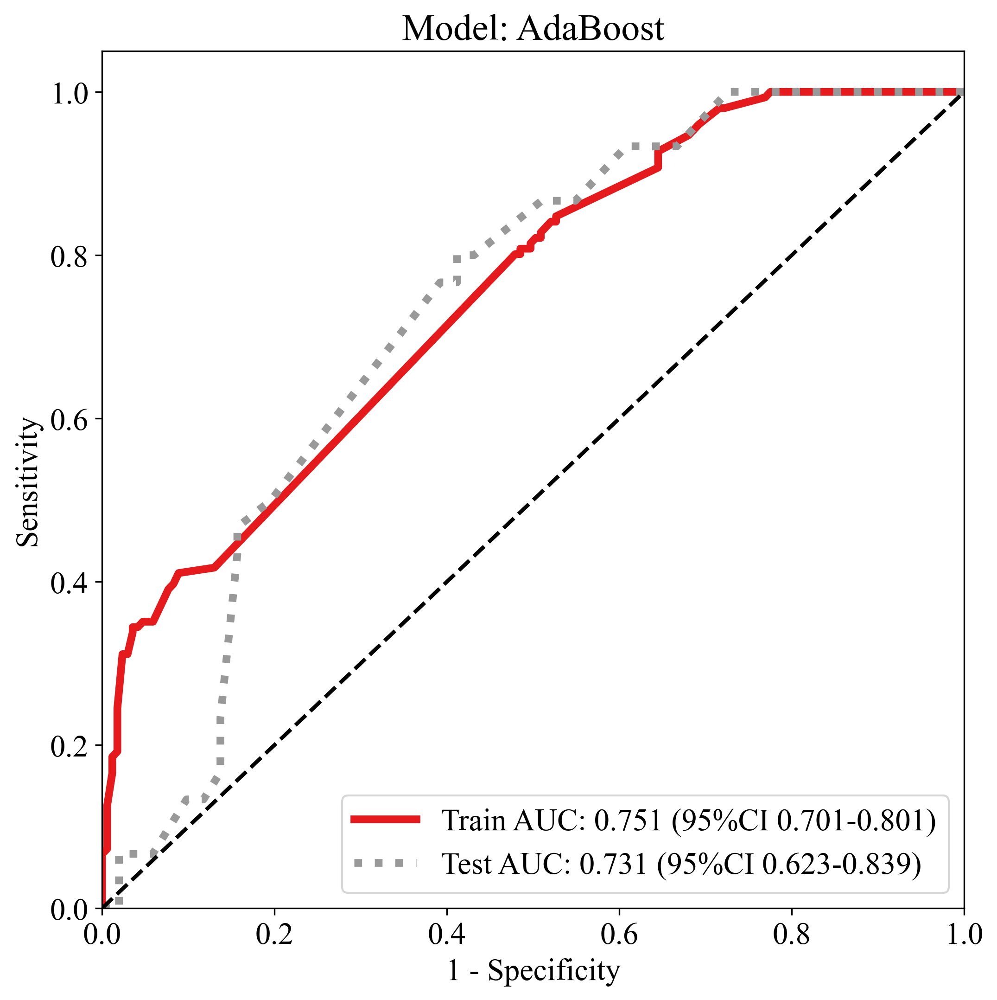

In [34]:
sel_model = model_names

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
    
        # Plot all ROC curves
        plt.figure(figsize=(8, 8))
        for pred_score, label in zip(pred_scores, labels):
            okcomp.comp1.draw_roc([np.array(y_train_sel[label]), np.array(y_test_sel[label])], 
                                  pred_score[sel_model_idx], 
                                  labels=['Train', 'Test'], title=f"Model: {sm}")
            plt.savefig(f'img/{task_type}model_{sm}_roc.svg', bbox_inches = 'tight')

#### 汇总所有模型

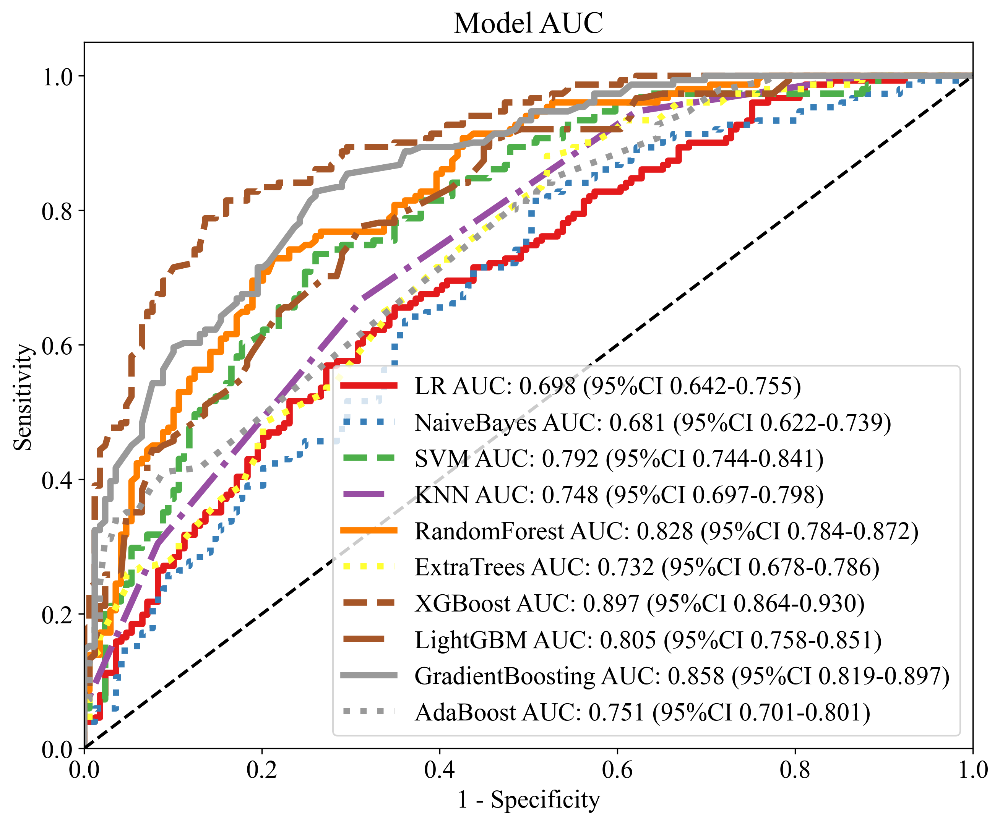

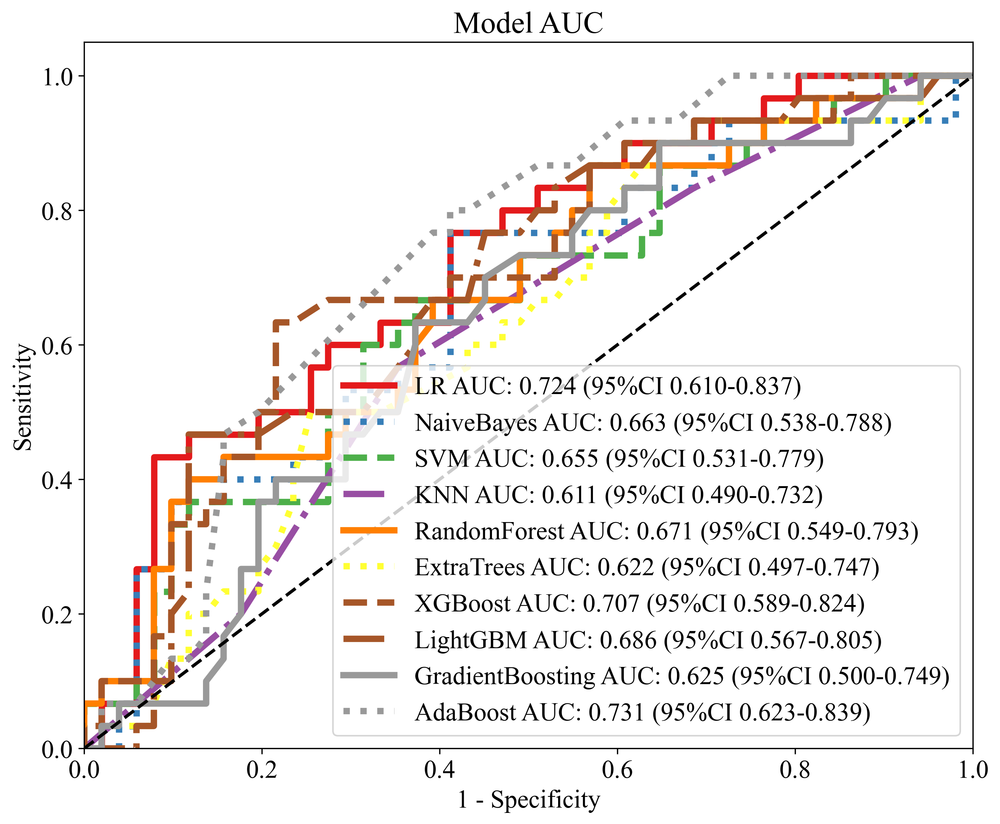

In [35]:
sel_model = model_names

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][0])
    okcomp.comp1.draw_roc([np.array(y_train_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Model AUC")
    plt.savefig(f'img/{task_type}model_roc_train.svg', bbox_inches = 'tight')
    plt.show()

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            pred_test_scores.append(pred_score[sel_model_idx][1])
    okcomp.comp1.draw_roc([np.array(y_test_sel[label])] * len(pred_test_scores), 
                          pred_test_scores, 
                          labels=sel_model, title=f"Model AUC")
    plt.savefig(f'img/{task_type}model_roc_test.svg', bbox_inches = 'tight')

### DCA 决策曲线

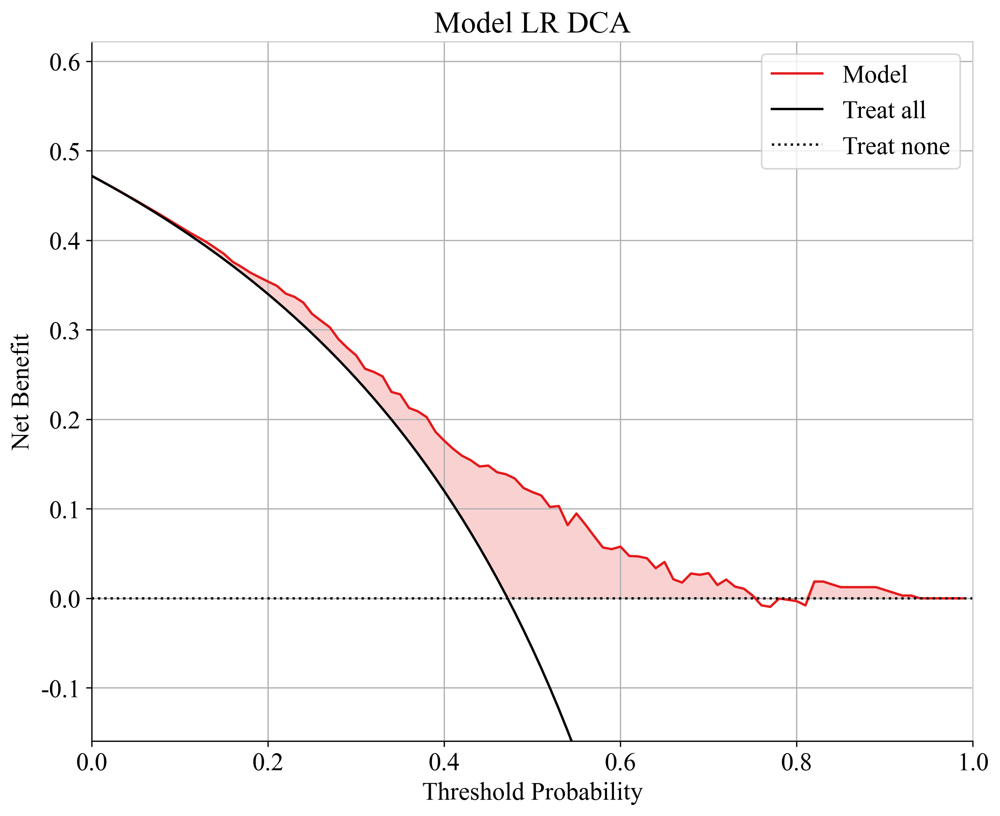

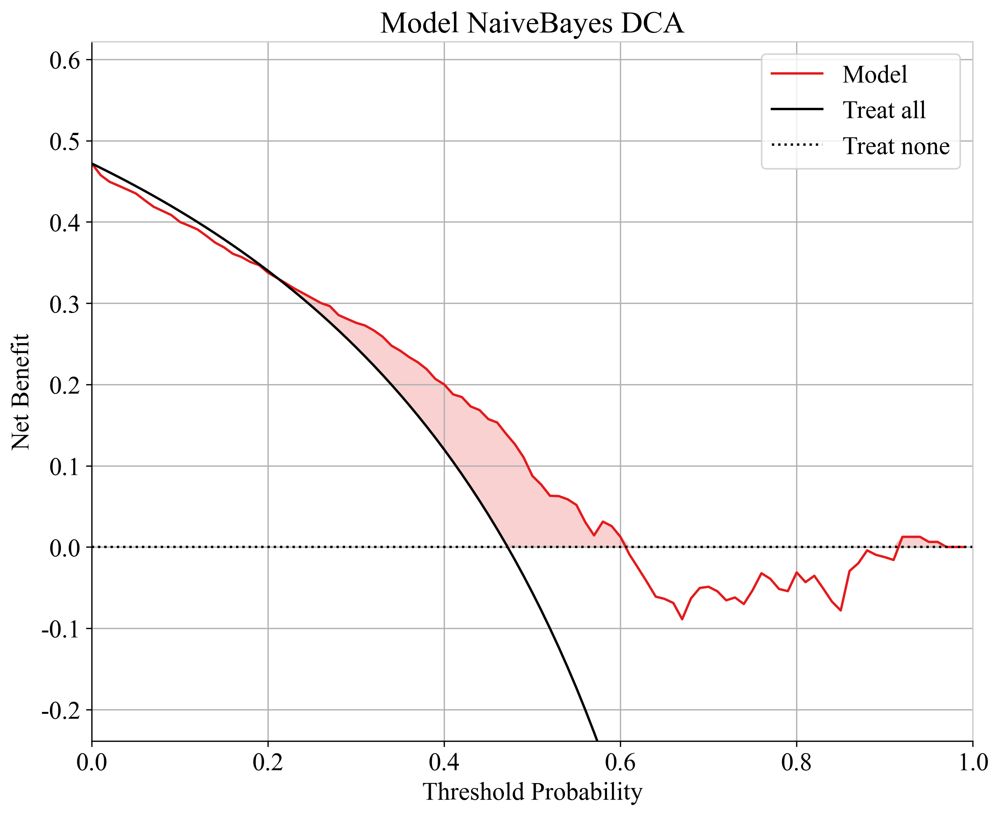

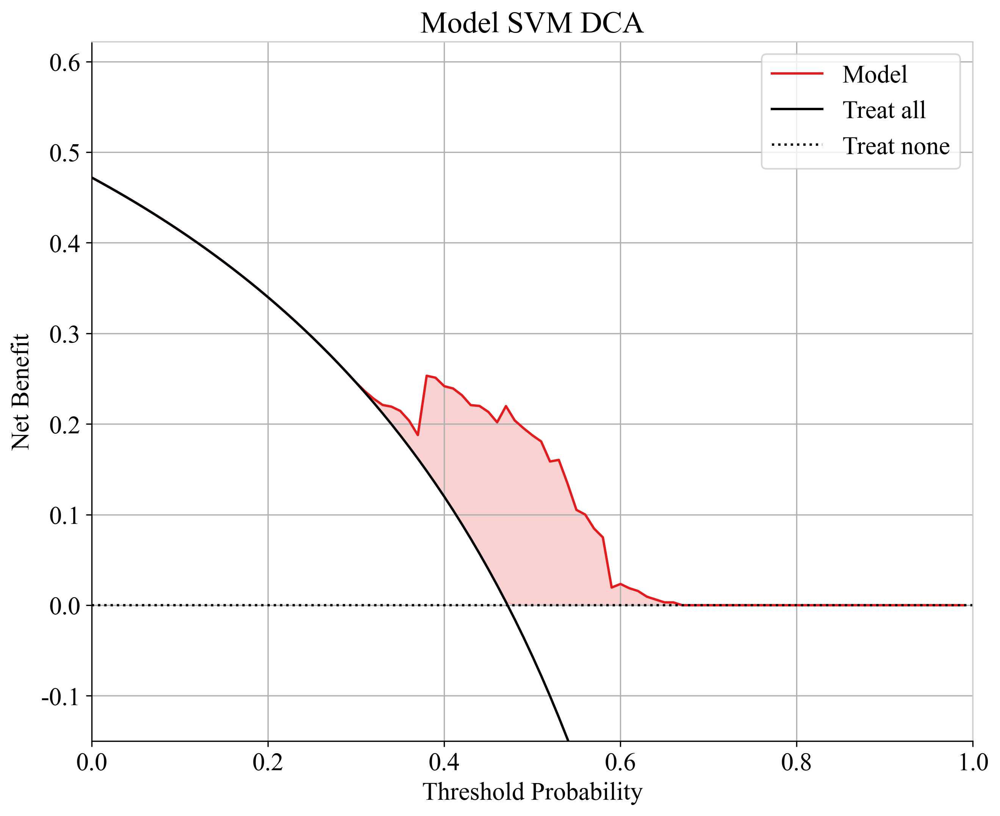

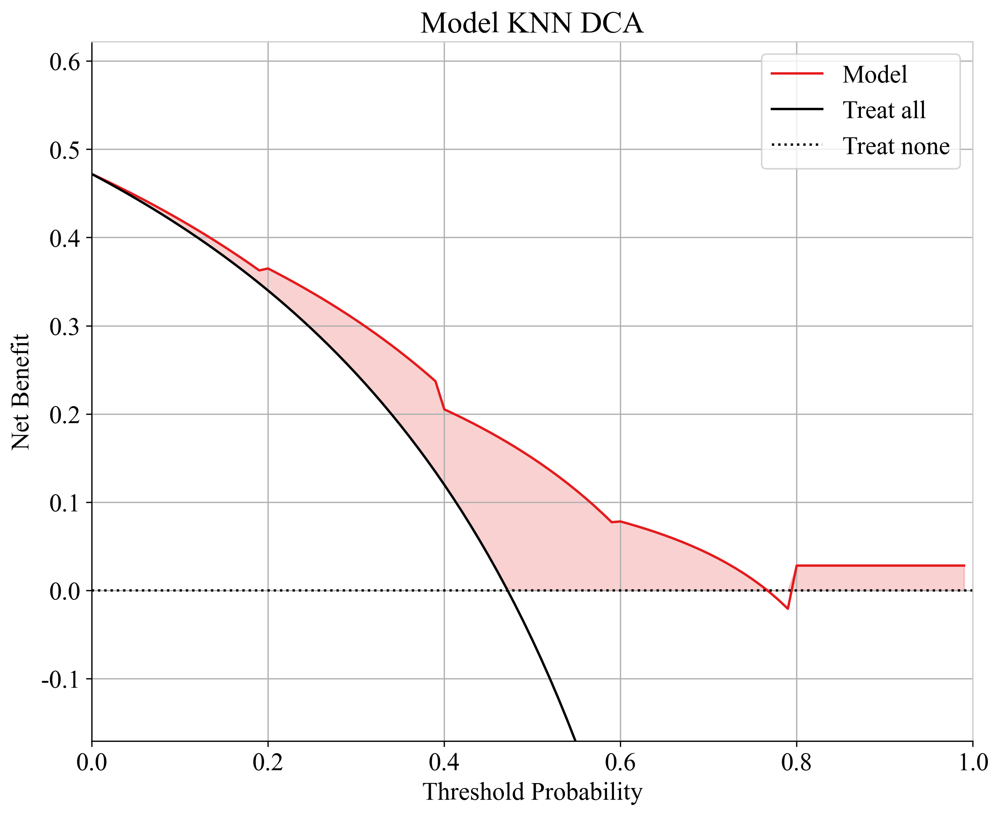

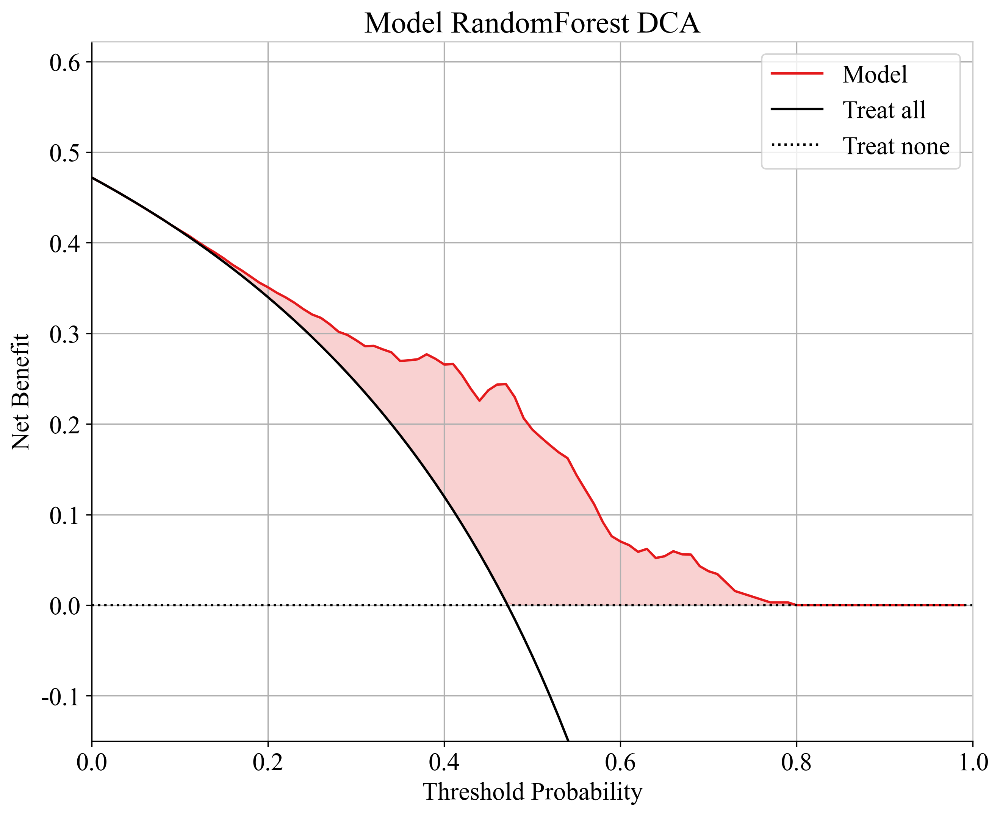

...

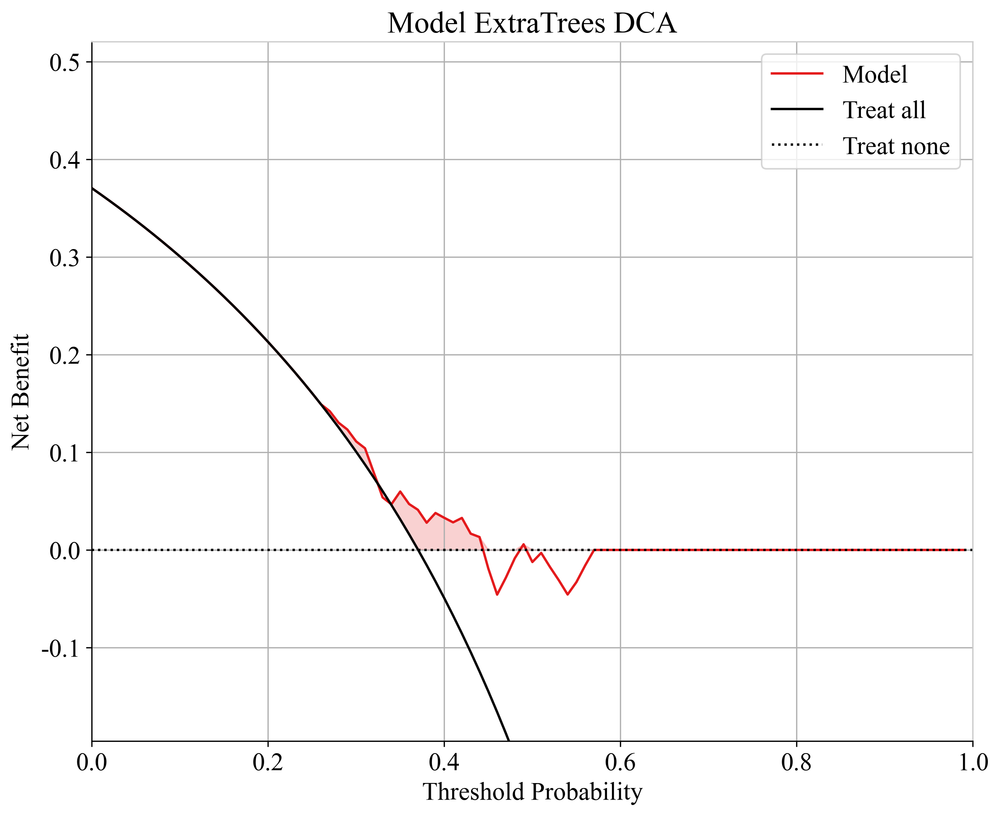

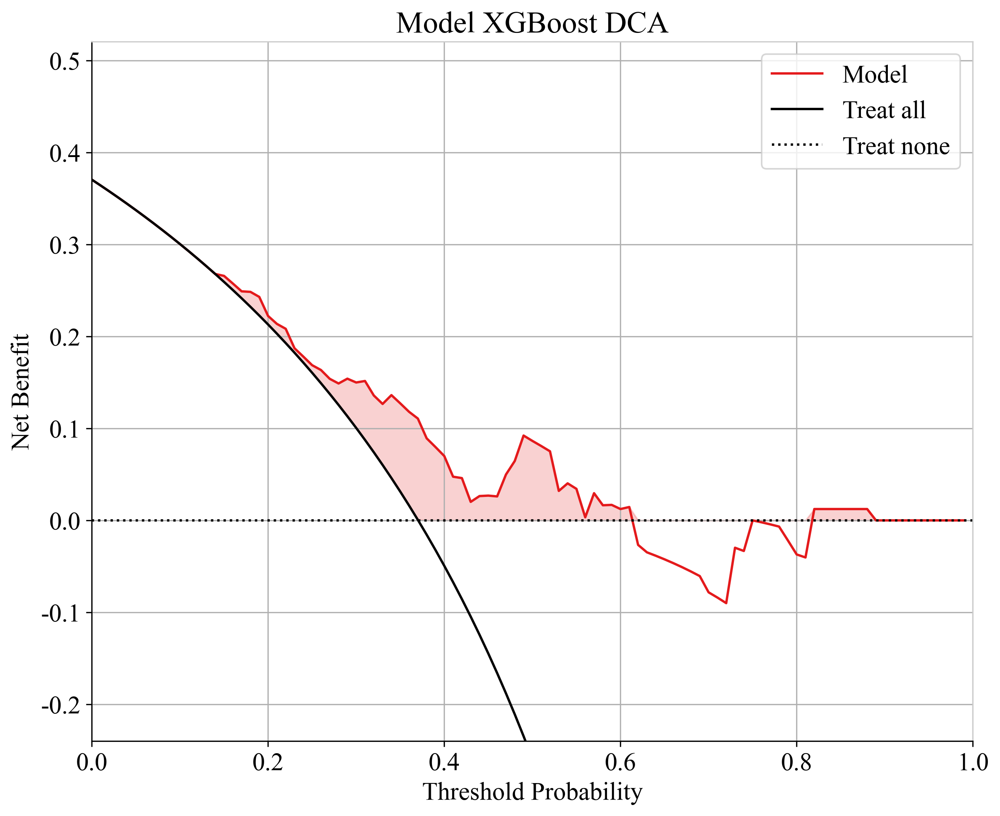

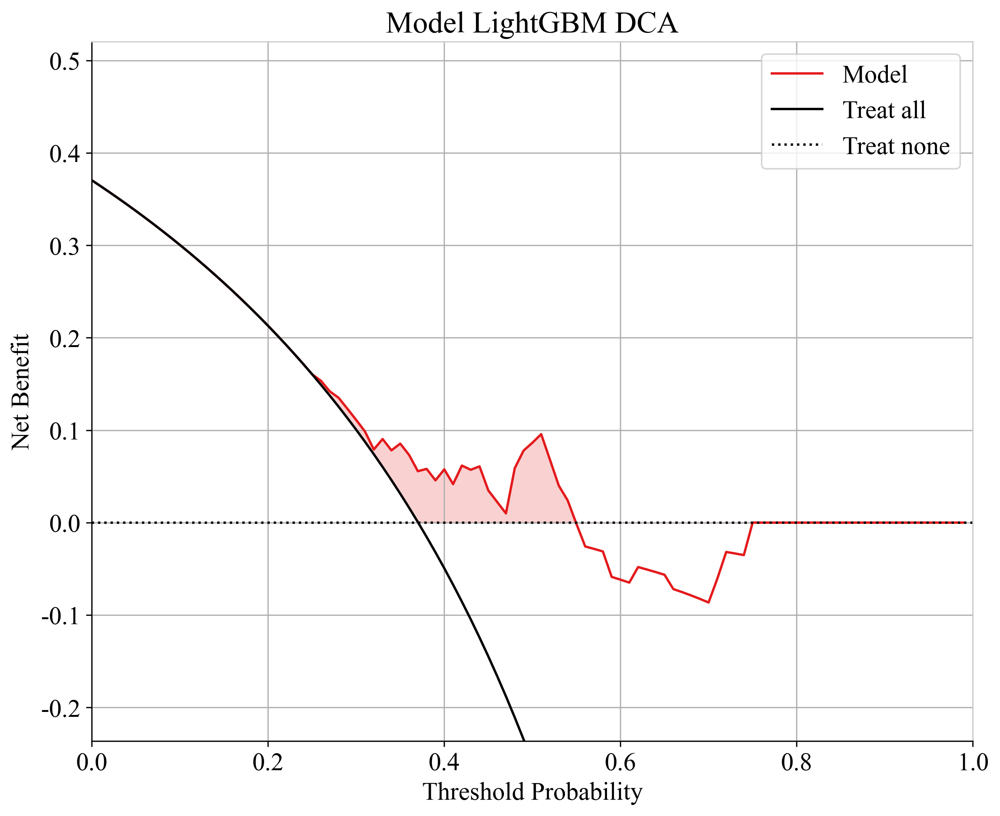

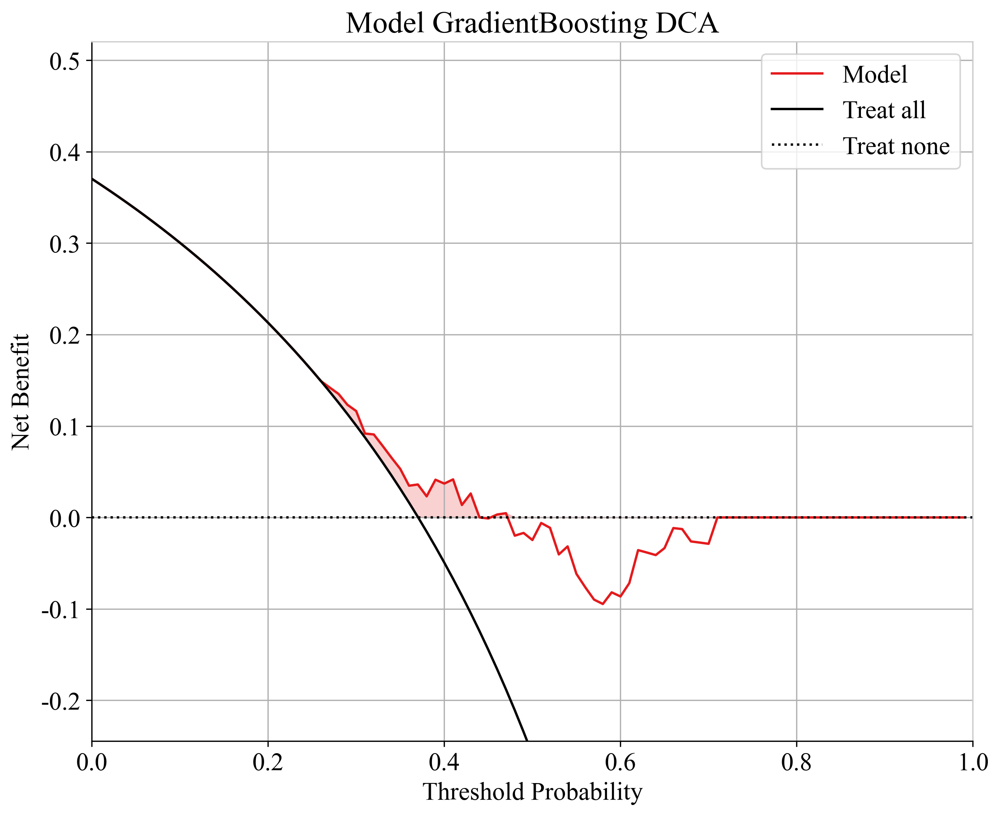

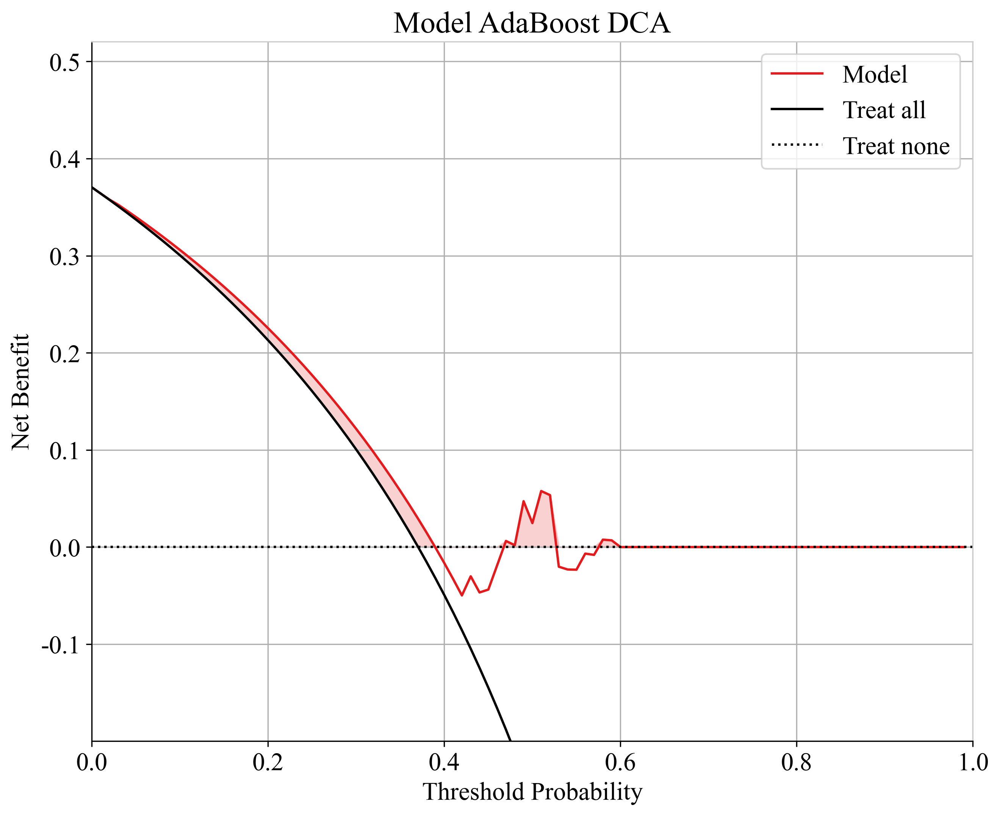

In [36]:
from onekey_algo.custom.components.comp1 import plot_DCA

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][0][:,1], np.array(y_train_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/{task_type}model_{sm}_dca_train.svg', bbox_inches = 'tight')
            plt.show()

for pred_score, label in zip(pred_scores, labels):
    pred_test_scores = []
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            okcomp.comp1.plot_DCA(pred_score[sel_model_idx][1][:,1], np.array(y_test_sel[label]),
                                  title=f'Model {sm} DCA')
            plt.savefig(f'img/{task_type}model_{sm}_dca_test.svg', bbox_inches = 'tight')

### 绘制混淆矩阵

绘制混淆矩阵，[混淆矩阵解释](https://baike.baidu.com/item/%E6%B7%B7%E6%B7%86%E7%9F%A9%E9%98%B5/10087822?fr=aladdin)
`sel_model = ['SVM', 'KNN']`参数为想要绘制的模型对应的参数。

如果需要修改标签到名称的映射，修改`class_mapping={1:'1', 0:'0'}`

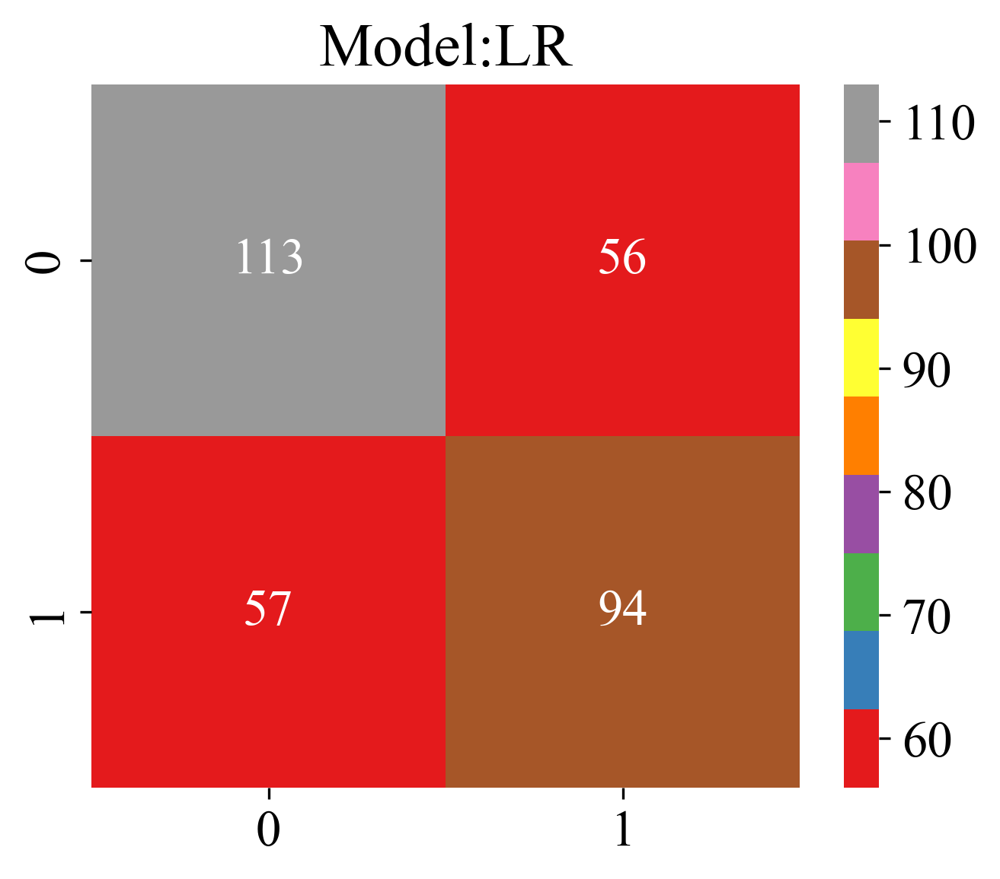

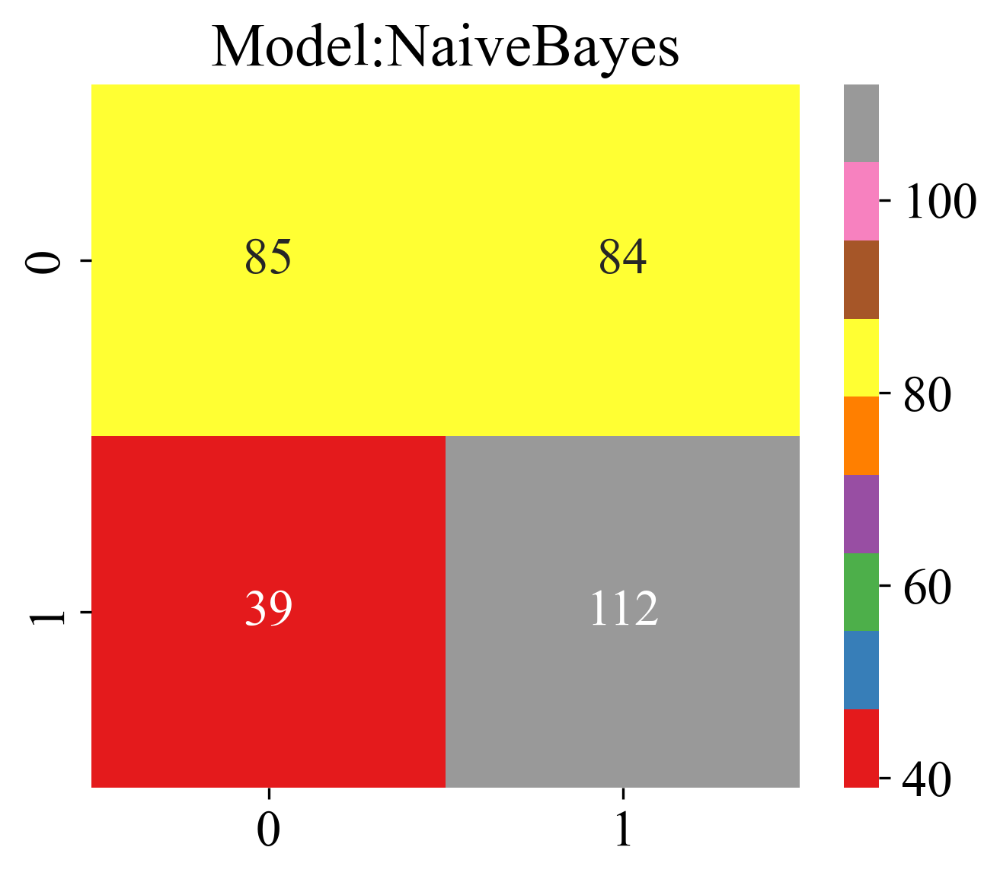

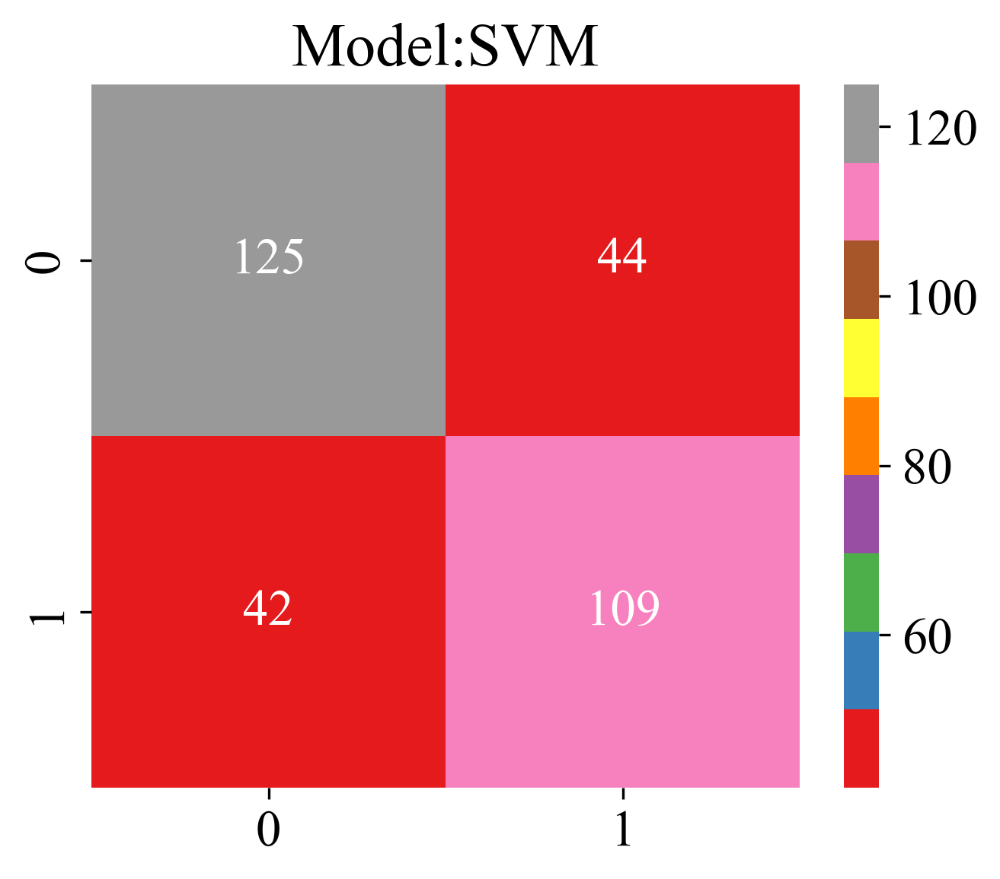

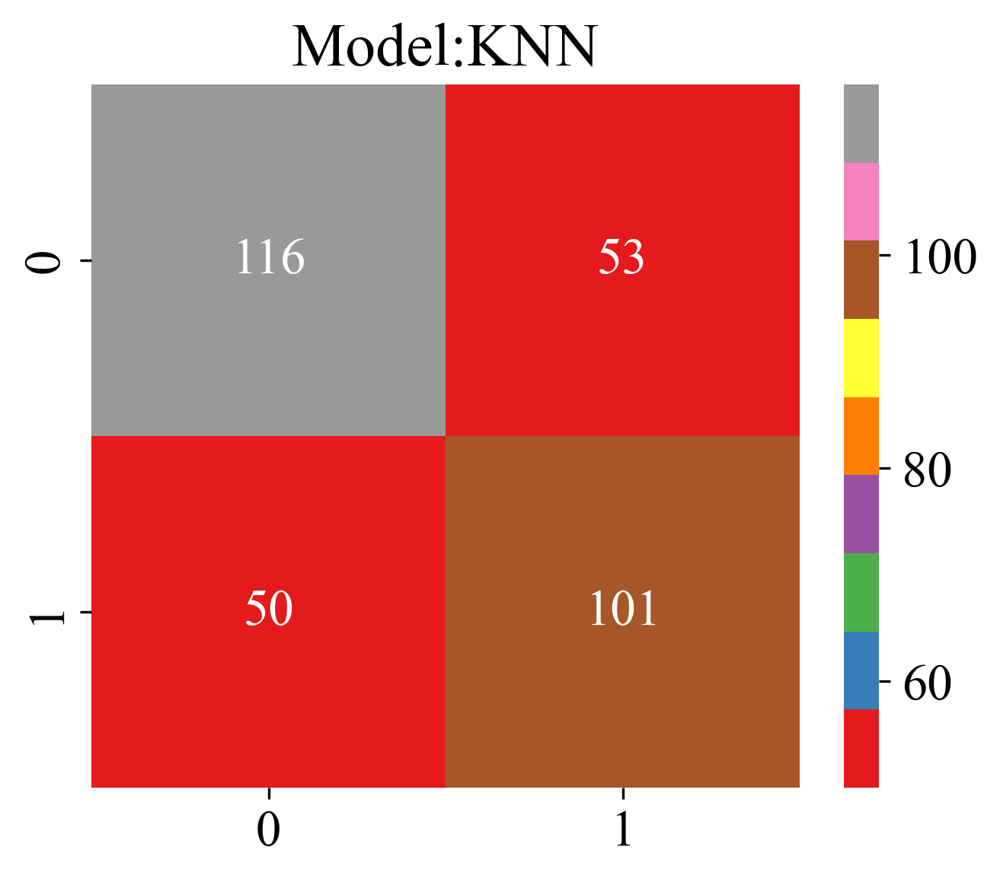

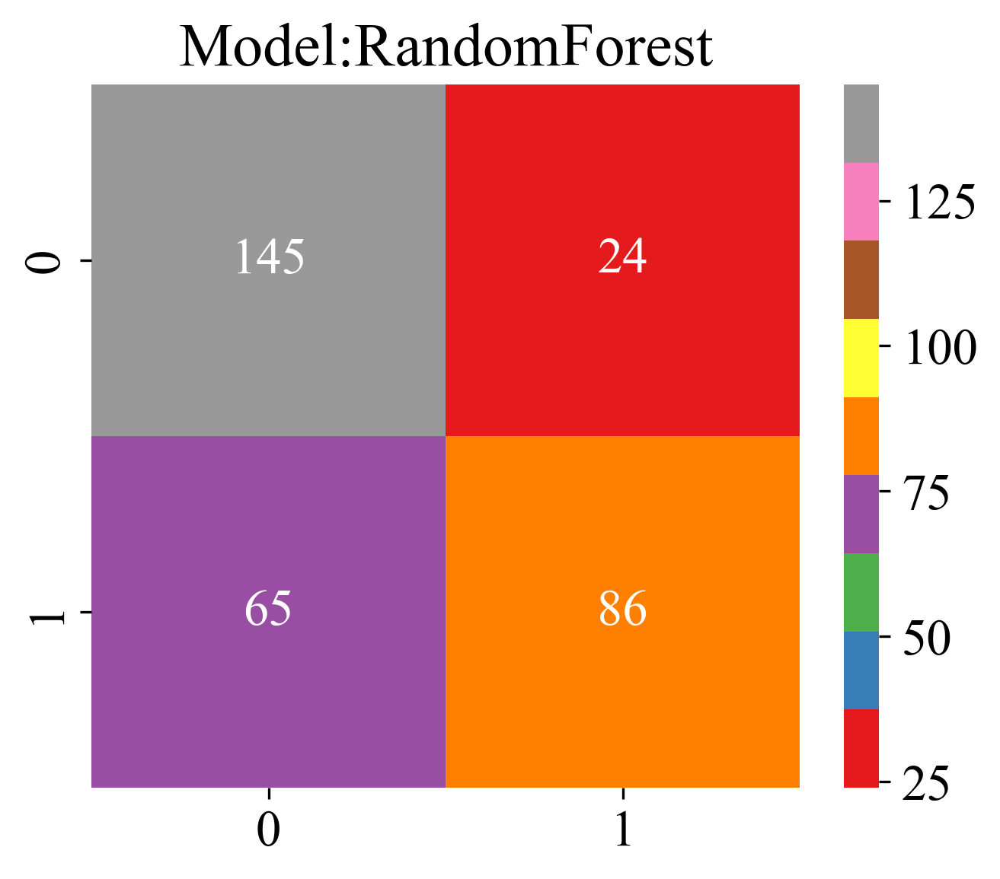

...

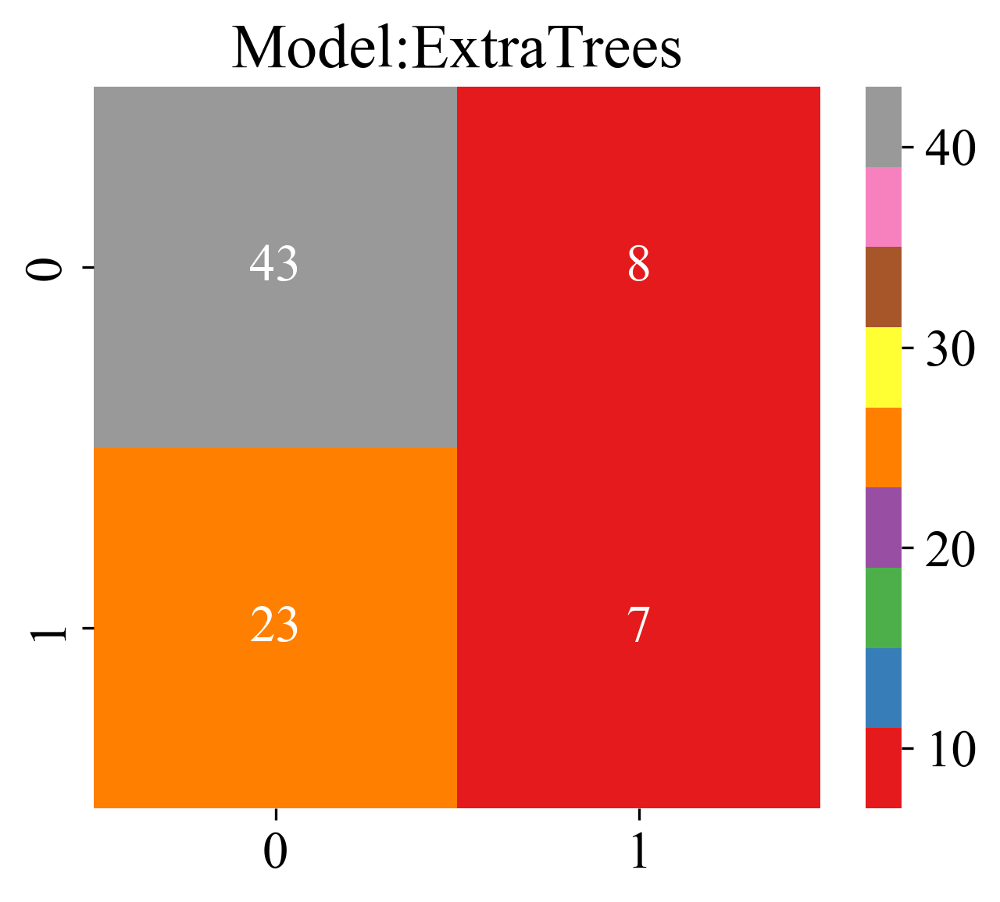

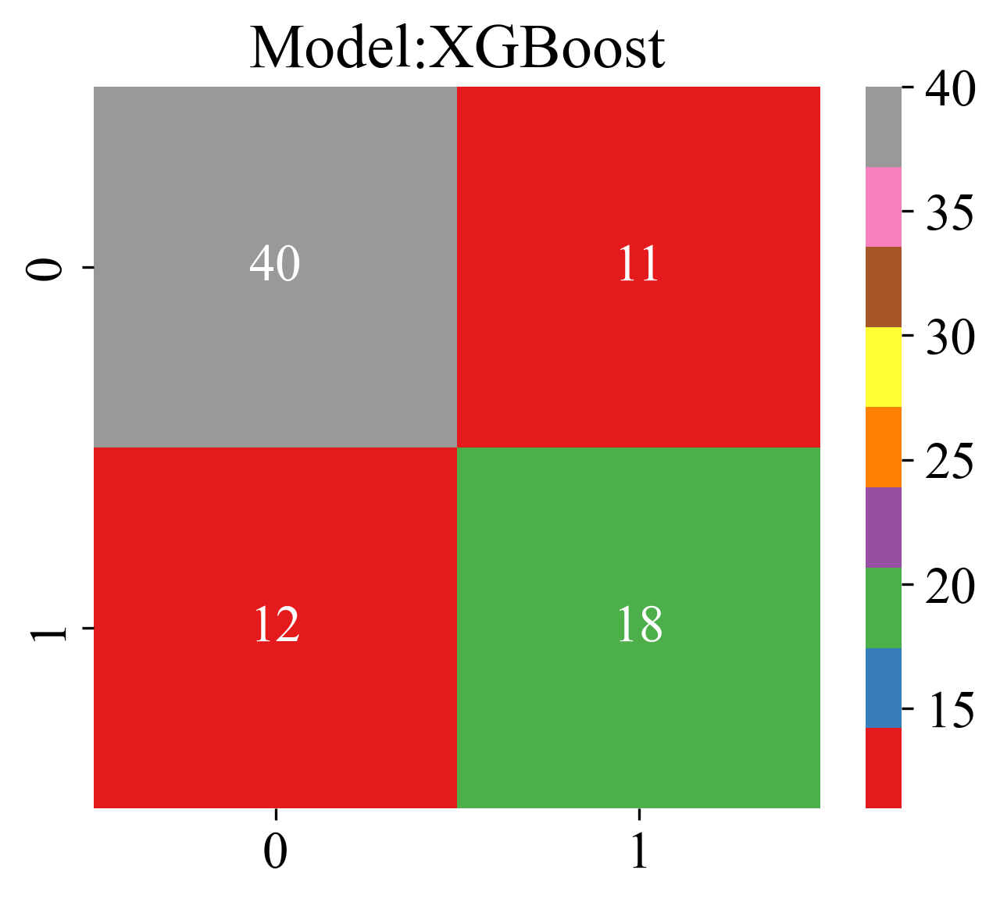

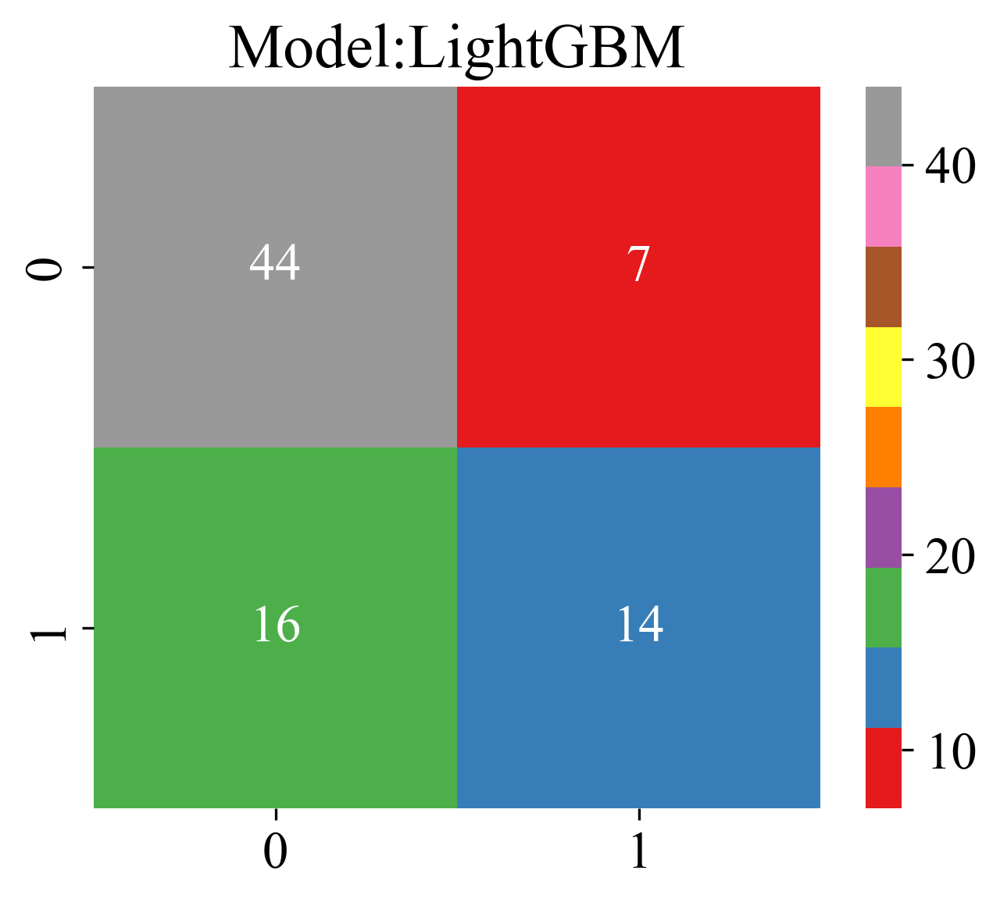

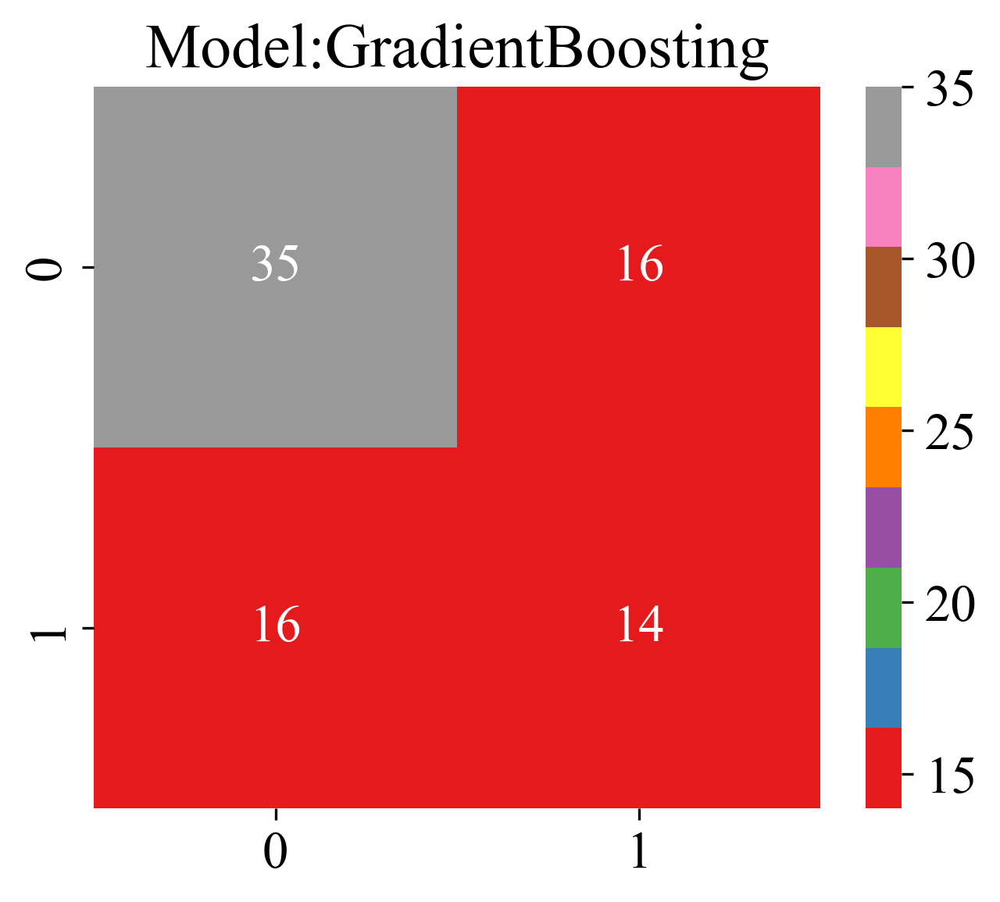

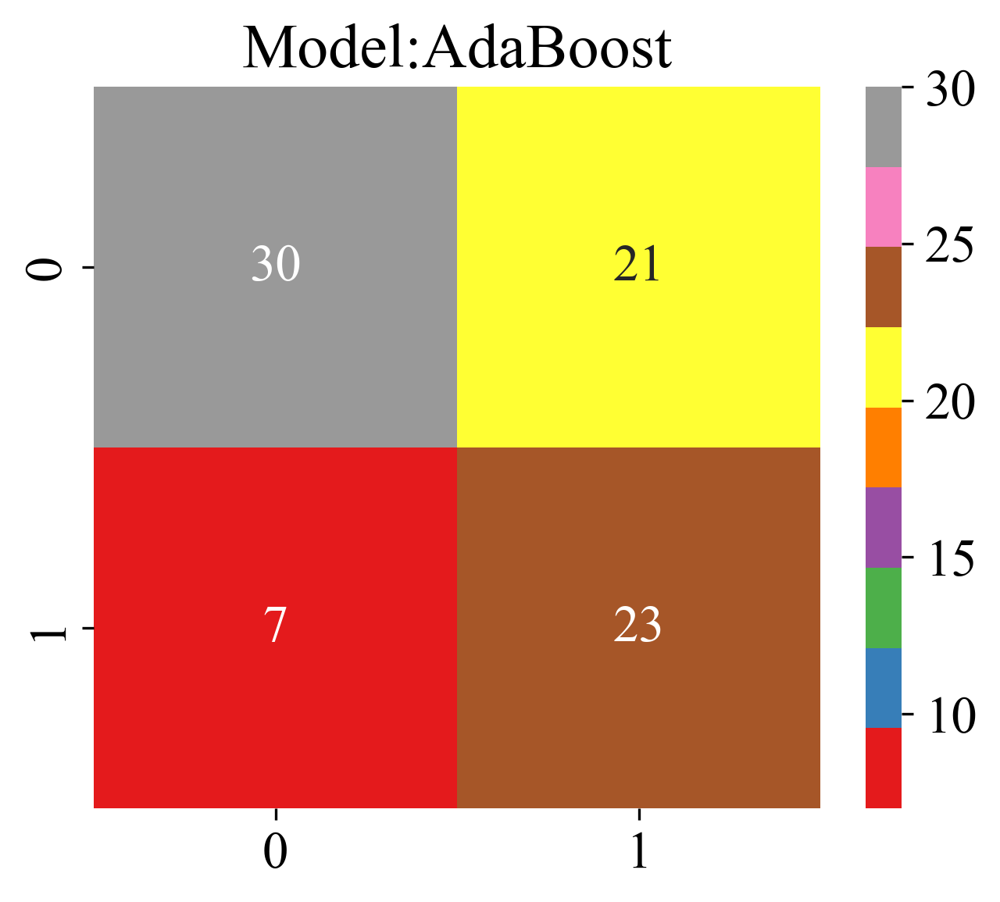

In [37]:
# 设置绘制参数
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][0], y_train_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/{task_type}model_{sm}_cm_train.svg', bbox_inches = 'tight')

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):
            cm = okcomp.comp1.calc_confusion_matrix(predictions[idx][sel_model_idx][-1], y_test_sel[label],
#                                                     sel_idx = pred_sel_idx[idx][sel_model_idx],
                                                    class_mapping={1:'1', 0:'0'}, num_classes=2)
            c_matrix[label] = cm
            plt.figure(figsize=(5, 4))
            plt.title(f'Model:{sm}')
            okcomp.comp1.draw_matrix(cm, norm=False, annot=True, cmap='Blues', fmt='.3g')
            plt.savefig(f'img/{task_type}model_{sm}_cm_test.svg', bbox_inches = 'tight')

### 样本预测直方图

绘制每个样本的预测结果以及对应的真实结果, 图例中label=xx可以修改成自己类别的真实标签。

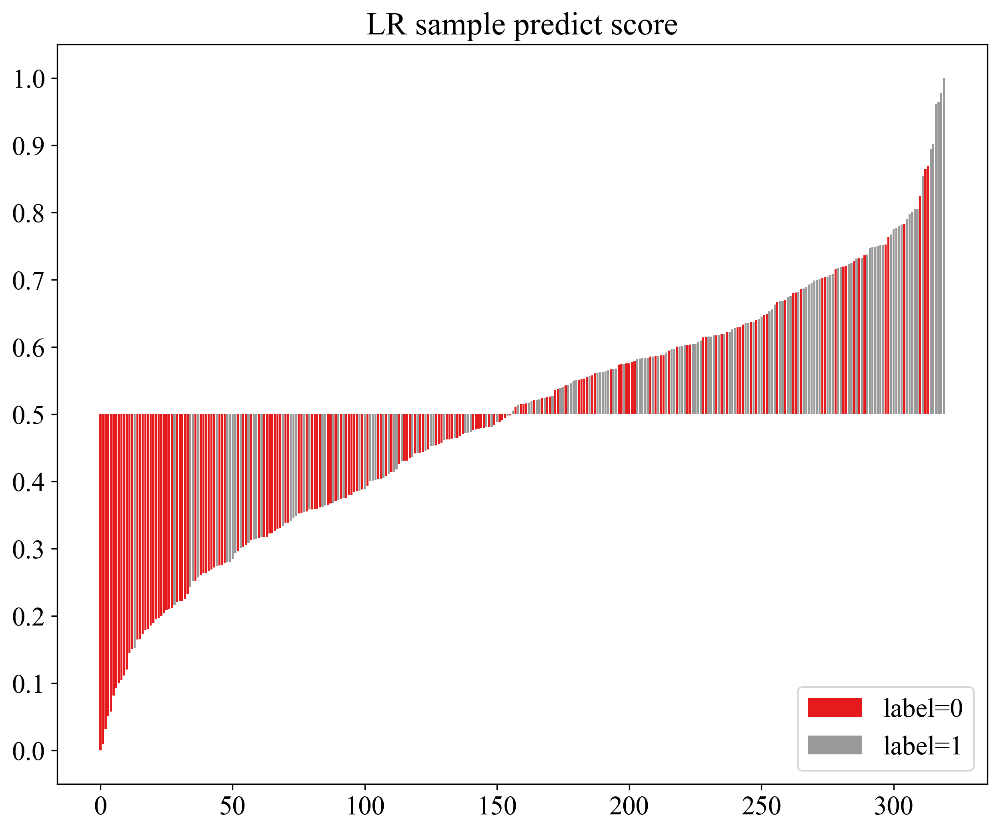

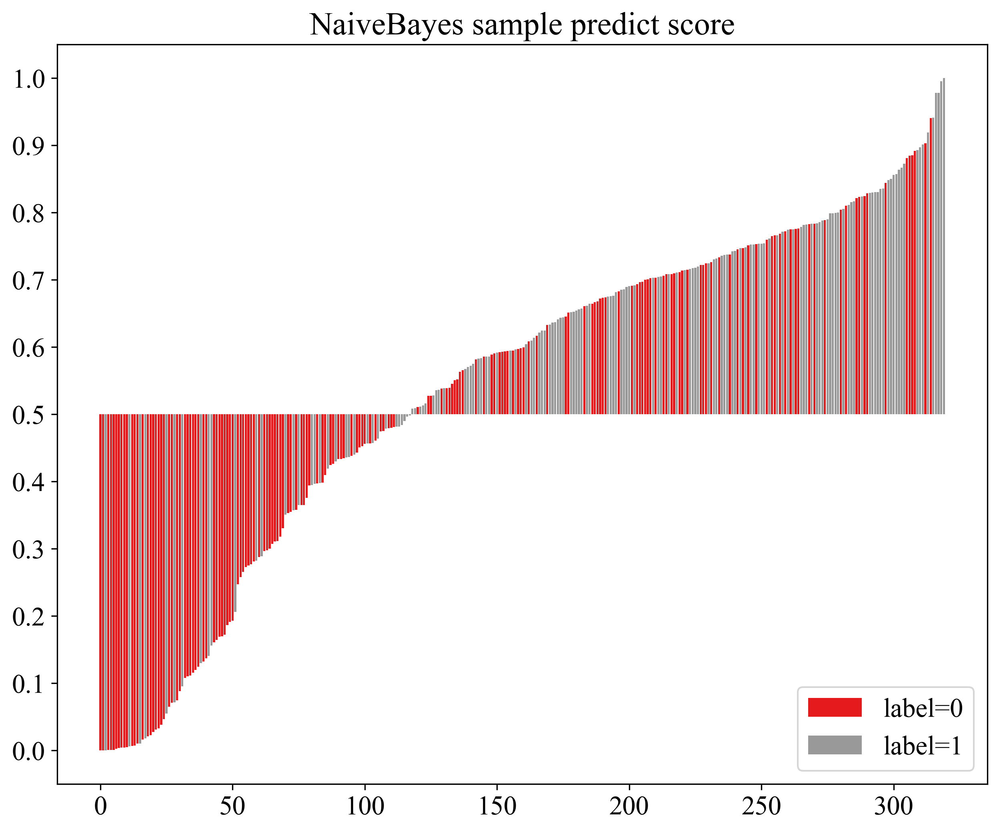

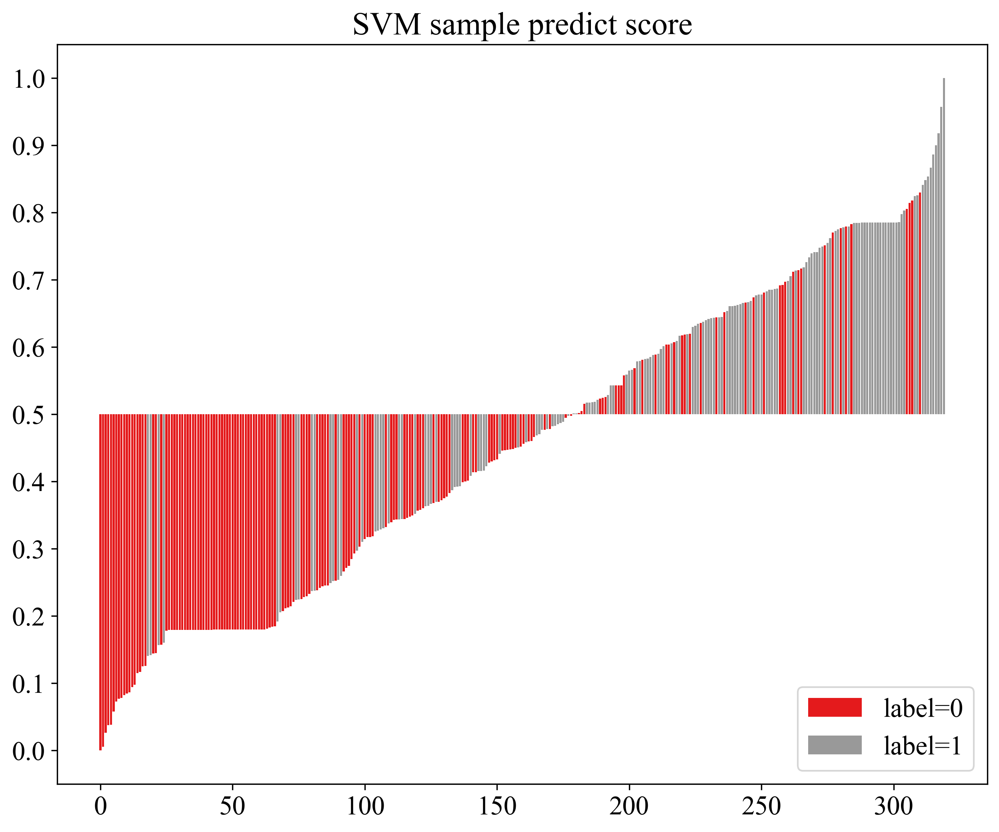

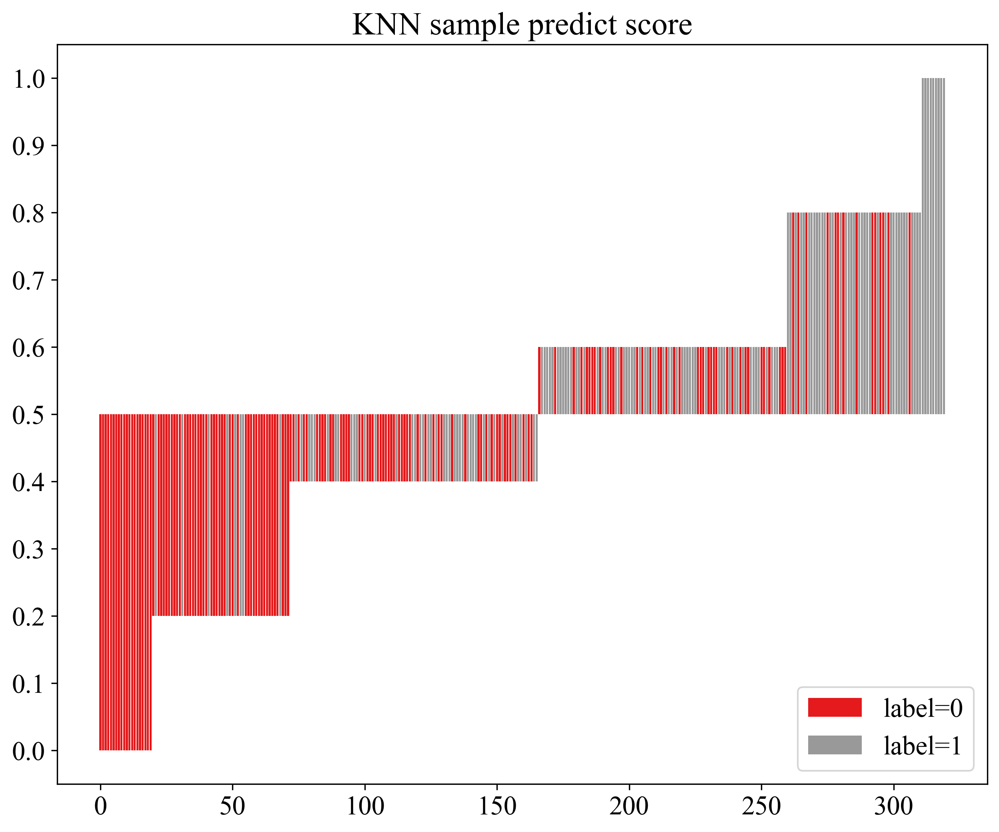

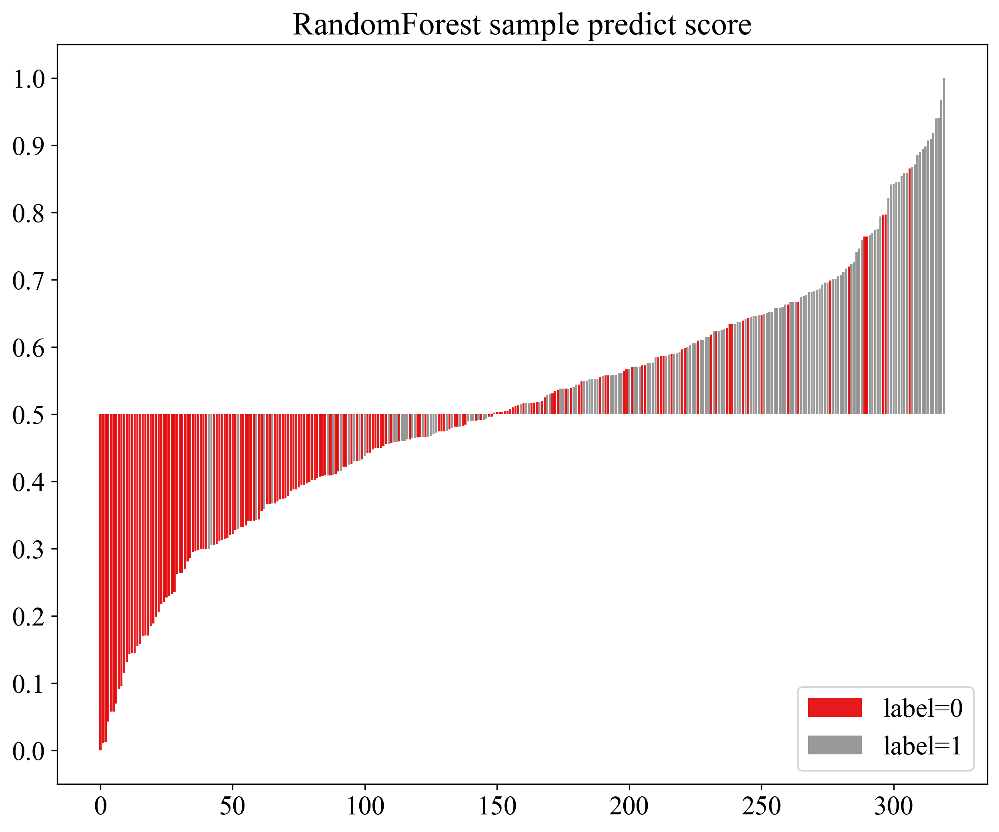

...

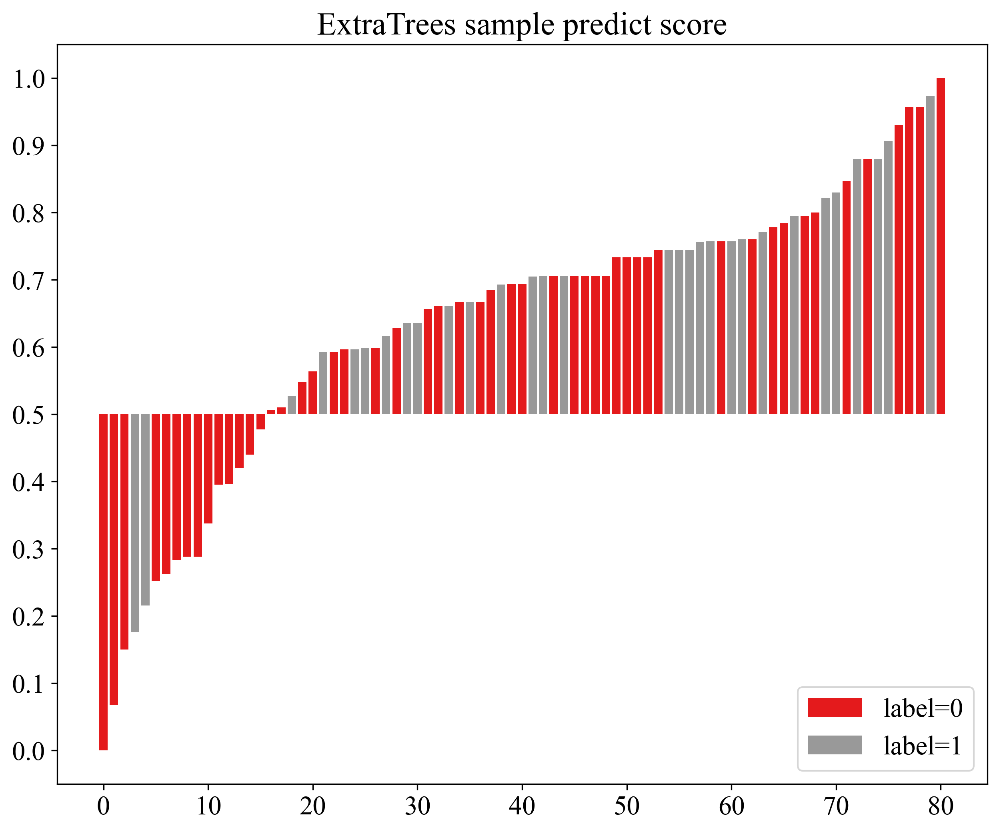

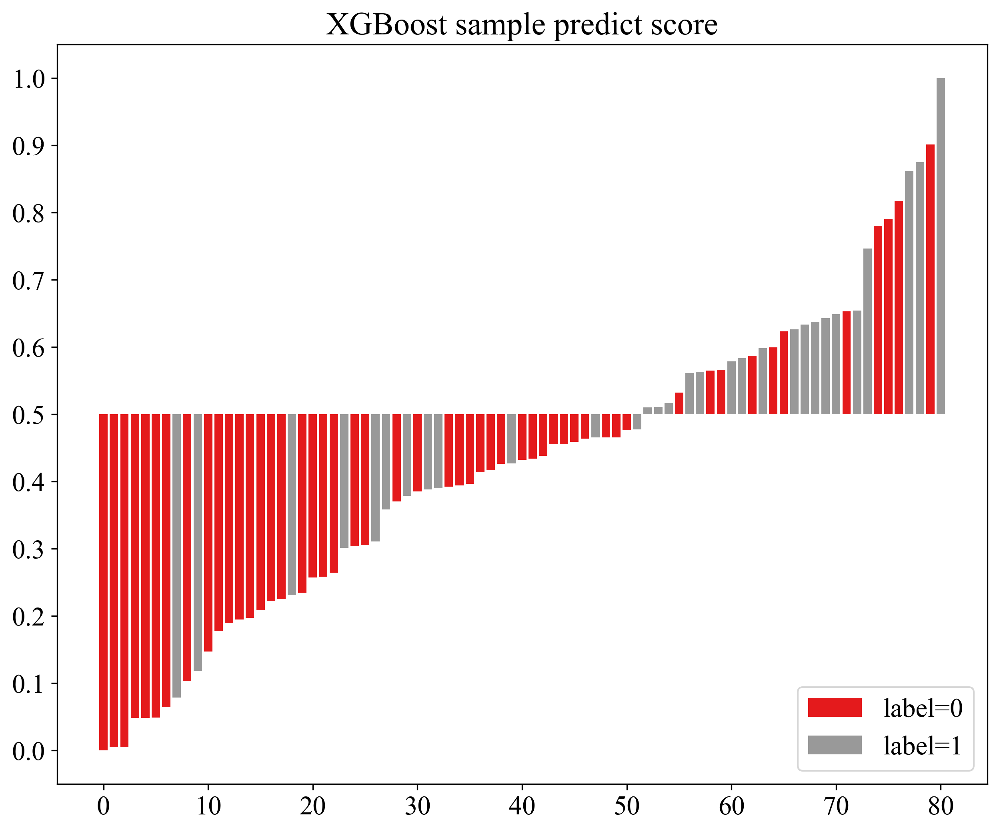

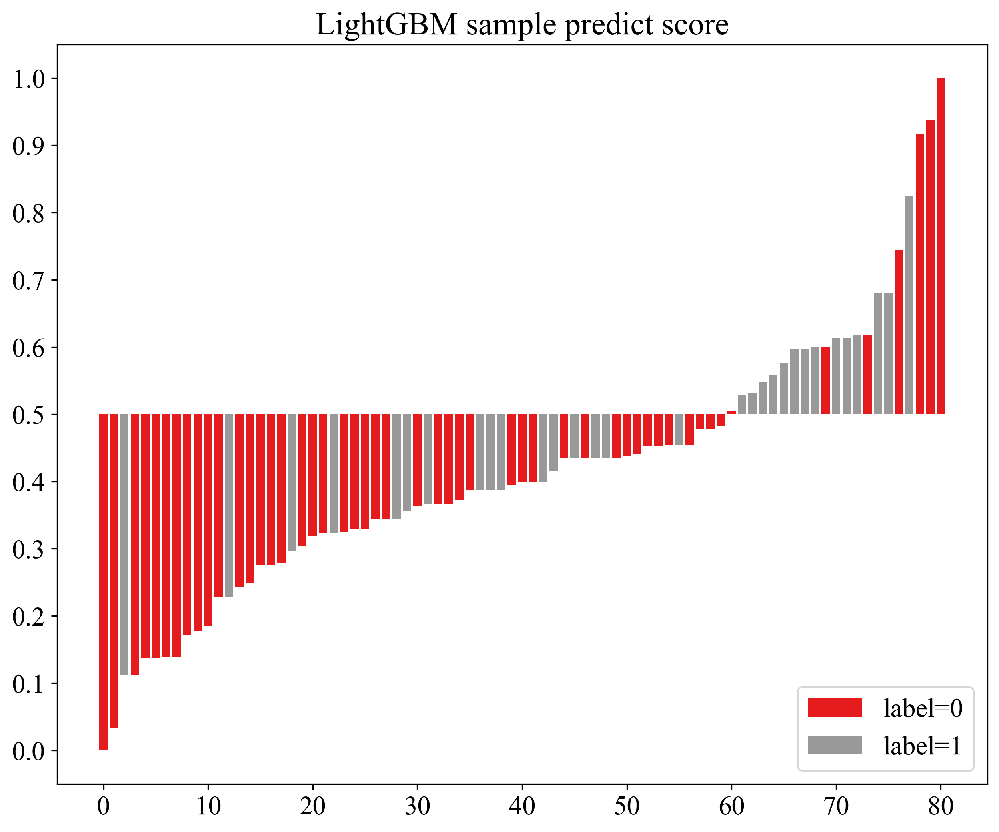

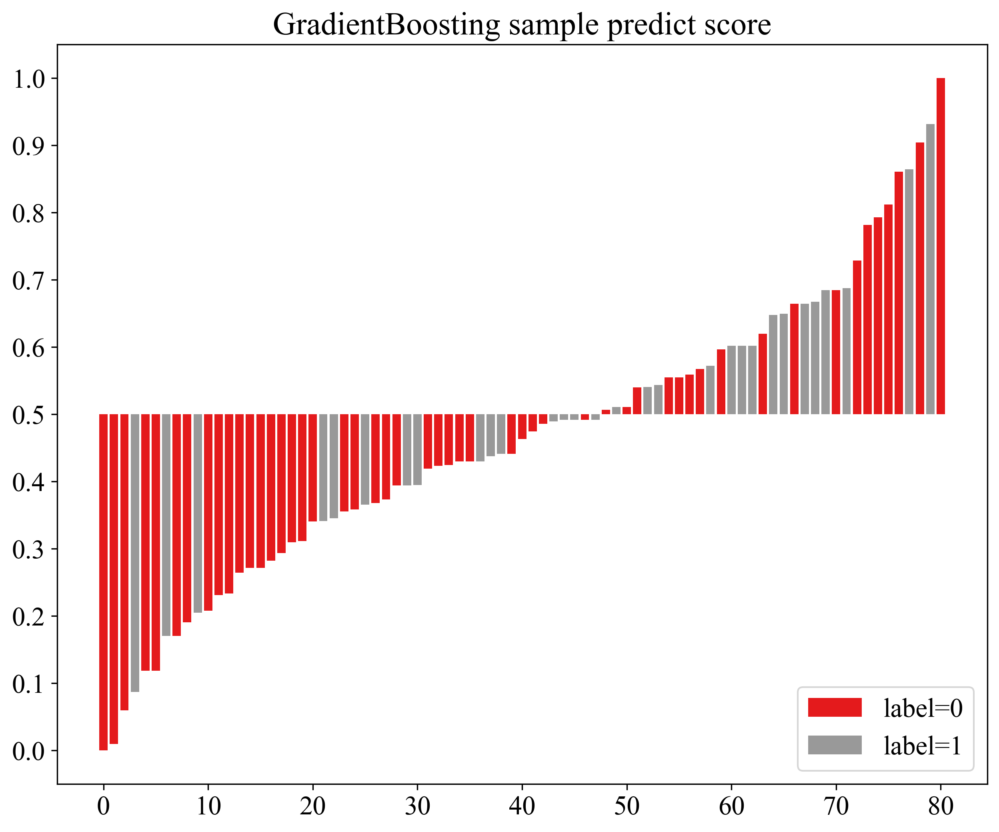

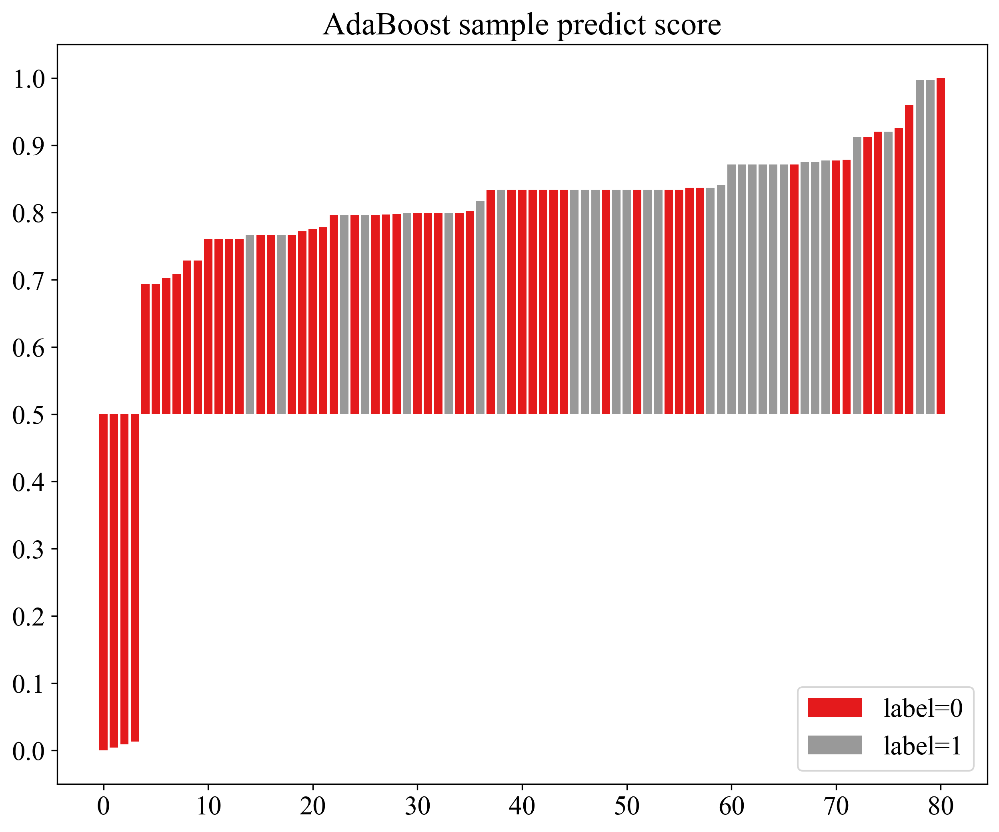

In [38]:
sel_model = model_names
c_matrix = {}

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][0], y_train_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0","label=1"],loc="lower right") 
            plt.savefig(f'img/{task_type}model_{sm}_sample_dis_train.svg', bbox_inches = 'tight')
            plt.show()

for sm in sel_model:
    if sm in model_names:
        sel_model_idx = model_names.index(sm)
        for idx, label in enumerate(labels):            
            okcomp.comp1.draw_predict_score(pred_scores[idx][sel_model_idx][-1], y_test_sel[label])
            plt.title(f'{sm} sample predict score')
            plt.legend(labels=["label=0","label=1"],loc="lower right") 
            plt.savefig(f'img/{task_type}model_{sm}_sample_dis_test.svg', bbox_inches = 'tight')
            plt.show()

## 保存模型结果

可以把模型预测的标签结果以及每个类别的概率都保存下来。

In [39]:
import os
import numpy as np

os.makedirs('results', exist_ok=True)
sel_model = sel_model

for idx, label in enumerate(labels):
    for sm in sel_model:
        if sm in model_names:
            sel_model_idx = model_names.index(sm)
            target = targets[idx][sel_model_idx]
            # 预测训练集和测试集数据。
            train_indexes = np.reshape(np.array(train_ids), (-1, 1)).astype(str)
            test_indexes = np.reshape(np.array(test_ids), (-1, 1)).astype(str)
            y_train_pred_scores = target.predict_proba(X_train_sel)
            y_test_pred_scores = target.predict_proba(X_test_sel)
            columns = ['ID'] + [f"{label}-{i}"for i in range(y_test_pred_scores.shape[1])]
            # 保存预测的训练集和测试集结果
            result_train = pd.DataFrame(np.concatenate([train_indexes, y_train_pred_scores], axis=1), columns=columns)
            result_train.to_csv(f'results/{task_type}{sm}_train.csv', index=False)
            result_test = pd.DataFrame(np.concatenate([test_indexes, y_test_pred_scores], axis=1), columns=columns)
            result_test.to_csv(f'results/{task_type}{sm}_test.csv', index=False)